# DigitDCGAN: Digit Generator with DCGAN

In this project, I designed and trained a Deep Convolutional Generative Adversarial Network (DCGAN) to generate realistic handwritten digits. The goal was to explore deep learning techniques for generative modeling, focusing on GAN architectures and training stability improvements.

#### **Project Objectives**


*   Build a Deep Convolutional GAN (DCGAN) to generate realistic handwritten digits using the MNIST dataset.
*   Implement adversarial training techniques to ensure model stability and convergence.
*   Visualize generated outputs across epochs to evaluate performance and demonstrate progressive improvement in image quality.

## 📚 Library Imports and Setup

In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

## 📦 Dataset Overview

For this project, I used the **MNIST** dataset, which contains 70,000 grayscale images of handwritten digits (0–9), each sized 28×28 pixels. The dataset provides a simple yet effective benchmark for evaluating generative models.

In [4]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20287246..1.7876288].


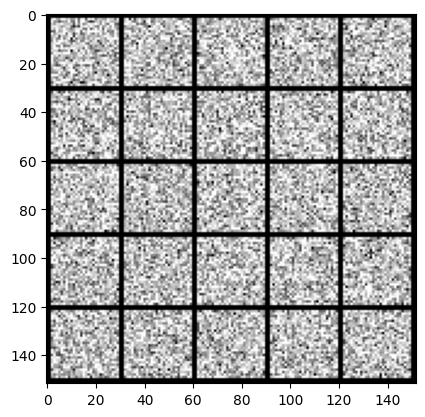

In [5]:
# Simulate 25 grayscale images in [0, 1] range
sample_images = torch.randn(25, 1, 28, 28) * 0.5 + 0.5
show_tensor_images(sample_images)

## 🧠 GAN Architecture

The DCGAN architecture consists of two competing neural networks: a generator and a discriminator. The generator transforms random noise into realistic digit images using transposed convolutions and batch normalization. The discriminator classifies images as real or fake through convolutional layers with LeakyReLU activations. Both networks are trained adversarially to improve performance.

### Generator
The generator is responsible for creating synthetic images from random noise vectors. Instead of specifying the full image dimensions, the generator takes the number of image channels as input, since DCGAN architectures use convolutional layers that operate independently of the overall image size. The number of channels, however, determines the filter configuration.

The generator architecture is built using four layers: three hidden layers and one output layer. Each hidden layer consists of transposed convolutions, batch normalization, and ReLU activation. The output layer uses a Tanh activation function to produce images with pixel values scaled between -1 and 1.


In [6]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN, 
        corresponding to a transposed convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''

        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size=kernel_size, stride=stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True)
            )
        
        else: # Final Layer
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh()
            )
        

    def unsqueeze_noise(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns a copy of that noise with width and height = 1 and channels = z_dim.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return noise.view(len(noise), self.z_dim, 1, 1)

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = self.unsqueeze_noise(noise)
        return self.gen(x)

In [7]:
from torchsummary import summary

# Create an instance of your Generator
gen = Generator(z_dim=64, im_chan=1, hidden_dim=64)

# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
gen = gen.to(device)

# Show model summary
summary(gen, input_size=(64, 1, 1))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 256, 3, 3]         147,712
       BatchNorm2d-2            [-1, 256, 3, 3]             512
              ReLU-3            [-1, 256, 3, 3]               0
   ConvTranspose2d-4            [-1, 128, 6, 6]         524,416
       BatchNorm2d-5            [-1, 128, 6, 6]             256
              ReLU-6            [-1, 128, 6, 6]               0
   ConvTranspose2d-7           [-1, 64, 13, 13]          73,792
       BatchNorm2d-8           [-1, 64, 13, 13]             128
              ReLU-9           [-1, 64, 13, 13]               0
  ConvTranspose2d-10            [-1, 1, 28, 28]           1,025
             Tanh-11            [-1, 1, 28, 28]               0
Total params: 747,841
Trainable params: 747,841
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/

### 🌪️ Noise Vector Generator
The `get_noise()` function generates random noise vectors, which serve as input to the Generator network during GAN training. These vectors are sampled from a standard normal distribution (`𝒩(0, 1)`) and are crucial for the Generator to learn diverse output patterns.

In [8]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

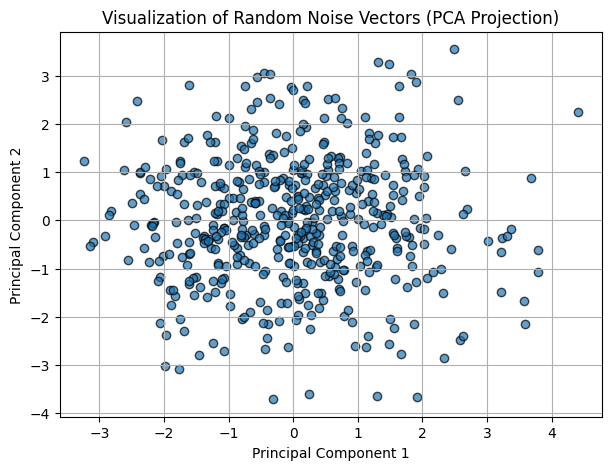

In [9]:
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Parameters
n_samples = 500
z_dim = 64

# Generate noise and project to 2D using PCA
noise = get_noise(n_samples, z_dim).cpu().numpy()
noise_2d = PCA(n_components=2).fit_transform(noise)

# Plot
plt.figure(figsize=(7, 5))
plt.scatter(noise_2d[:, 0], noise_2d[:, 1], alpha=0.7, edgecolor='k')
plt.title("Visualization of Random Noise Vectors (PCA Projection)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.grid(True)
plt.show()

## Discriminator
The Discriminator in DCGAN is a CNN with three convolutional layers, each followed by batch normalization and LeakyReLU activation (slope 0.2). It progressively reduces spatial dimensions while increasing feature maps, ultimately outputting a scalar value to classify images as "real" or "fake." It uses LeakyReLU for all layers.


In [10]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
    hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=16):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of DCGAN, 
        corresponding to a convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        
        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True)
            )
        
        else: # Final Layer
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride)

            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [11]:
from torchsummary import summary

# Initialize model
discriminator = Discriminator(im_chan=1, hidden_dim=128).to('cuda' if torch.cuda.is_available() else 'cpu')

# Print summary
summary(discriminator, input_size=(1, 28, 28))  # Corrected input size for MNIST images

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 128, 13, 13]           2,176
       BatchNorm2d-2          [-1, 128, 13, 13]             256
         LeakyReLU-3          [-1, 128, 13, 13]               0
            Conv2d-4            [-1, 256, 5, 5]         524,544
       BatchNorm2d-5            [-1, 256, 5, 5]             512
         LeakyReLU-6            [-1, 256, 5, 5]               0
            Conv2d-7              [-1, 1, 1, 1]           4,097
Total params: 531,585
Trainable params: 531,585
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.64
Params size (MB): 2.03
Estimated Total Size (MB): 2.67
----------------------------------------------------------------


## Training Strategy
The GAN was trained through adversarial learning:

* Discriminator Training:
  Trained to distinguish between real MNIST images and synthetic images.

* Generator Training:
  Trained to produce synthetic images that can fool the discriminator.

Key training details:

Optimizer: Adam with tuned hyperparameters

Loss Function: Binary Cross-Entropy Loss for both networks

Periodic visualization of generated samples to monitor progress

Special attention was given to stabilizing training by careful initialization, optimizer configuration, and network design.


### 🔧 Training Hyperparameters

In [12]:
criterion = nn.BCEWithLogitsLoss()
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002

beta_1 = 0.5 
beta_2 = 0.999

### 🖼️ Dataset Preprocessing

In [13]:
from torchvision import datasets, transforms

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

transform = transforms.Compose([
    transforms.Grayscale(),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataset_path = 'mnist_png'

dataloader = DataLoader(
    datasets.ImageFolder(root=dataset_path, transform=transform),
    batch_size=batch_size,
    shuffle=True
)

### 🔄 Model Initialization and Loss Functions

In [14]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr, betas=(beta_1, beta_2))

# You initialize the weights to the normal distribution
# with mean 0 and standard deviation 0.02
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

 46%|████▌     | 500/1094 [05:35<06:04,  1.63it/s]

Epoch 0, step 500: Generator loss: 0.9652587440013882, discriminator loss: 0.49792395448684695


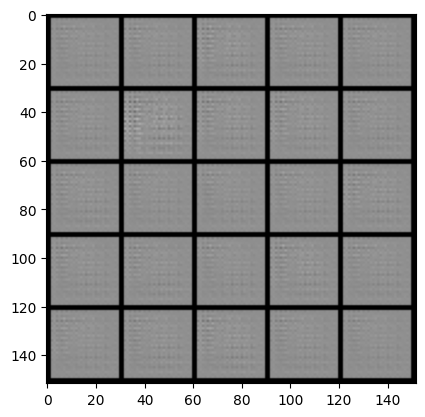

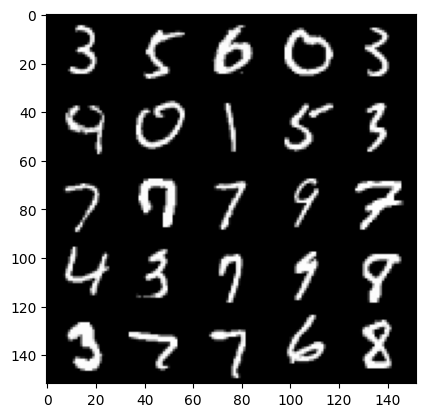

 91%|█████████▏| 1000/1094 [10:42<00:55,  1.71it/s]

Epoch 0, step 1000: Generator loss: 2.492995764255521, discriminator loss: 0.11444570893794292


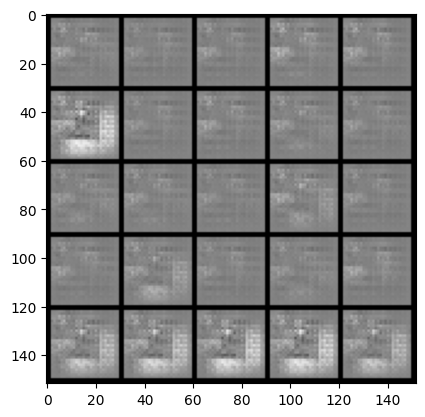

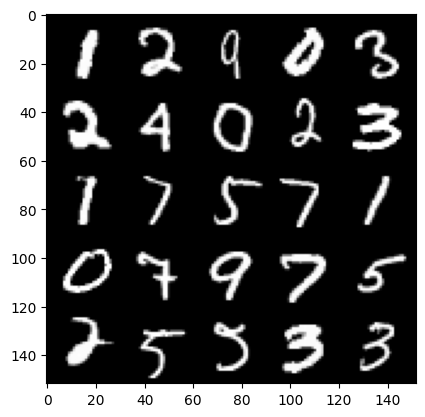

 37%|███▋      | 406/1094 [03:44<06:47,  1.69it/s]

Epoch 1, step 1500: Generator loss: 2.2311337737441046, discriminator loss: 0.2876842312142253


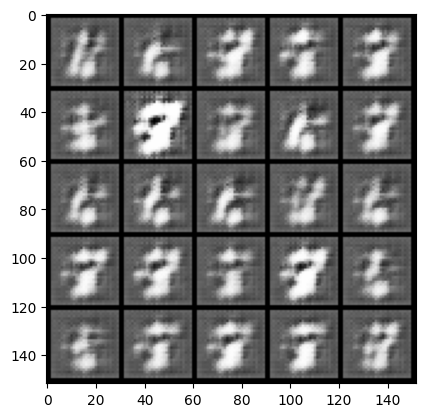

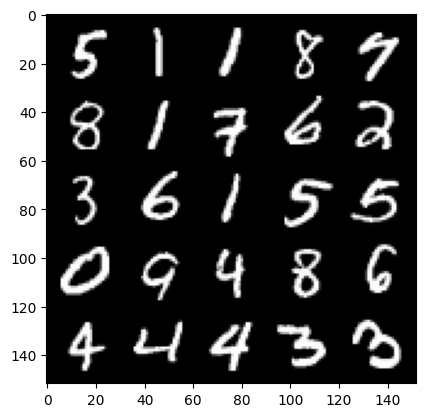

 83%|████████▎ | 906/1094 [08:50<01:43,  1.82it/s]

Epoch 1, step 2000: Generator loss: 1.3422723040282711, discriminator loss: 0.4858096442818642


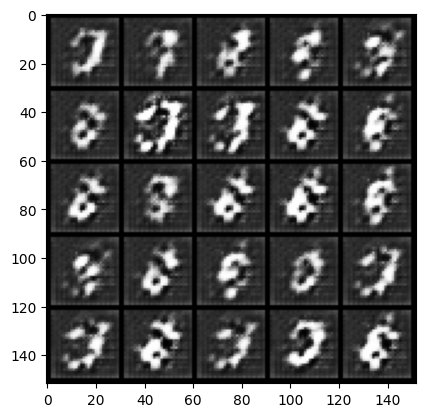

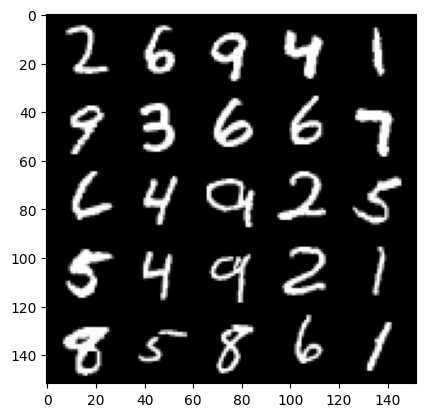

 29%|██▊       | 312/1094 [00:43<01:47,  7.30it/s]

Epoch 2, step 2500: Generator loss: 1.205511761397123, discriminator loss: 0.5038282596468925


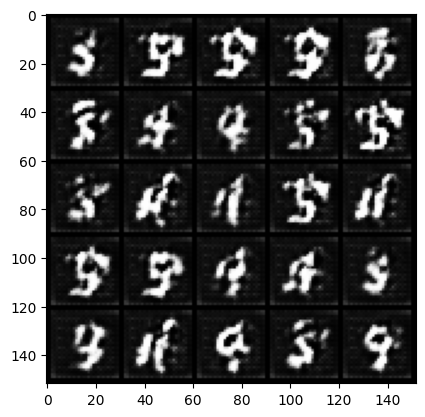

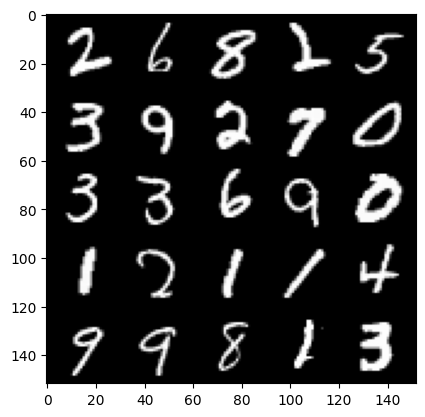

 74%|███████▍  | 812/1094 [01:52<00:39,  7.06it/s]

Epoch 2, step 3000: Generator loss: 0.9694423060417179, discriminator loss: 0.5629487451910977


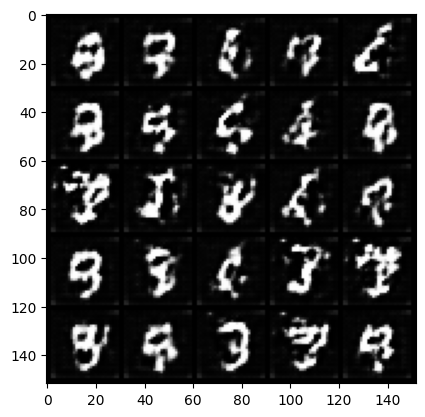

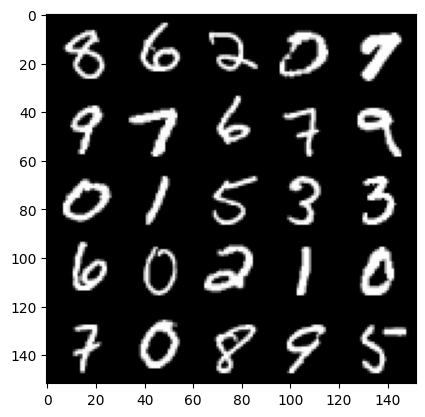

 20%|█▉        | 218/1094 [00:22<01:23, 10.48it/s]

Epoch 3, step 3500: Generator loss: 0.9114969404339787, discriminator loss: 0.6019963957667346


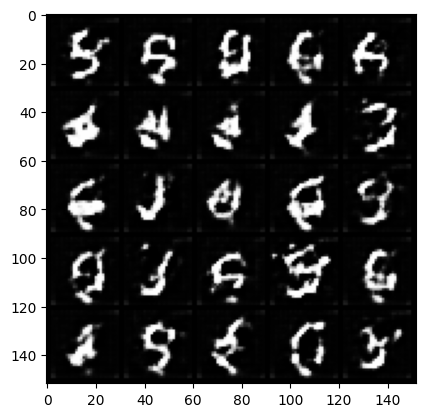

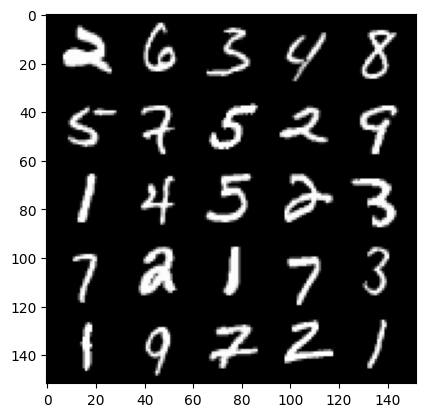

 66%|██████▌   | 717/1094 [01:12<00:38,  9.70it/s]

Epoch 3, step 4000: Generator loss: 0.846755994796753, discriminator loss: 0.622620517134666


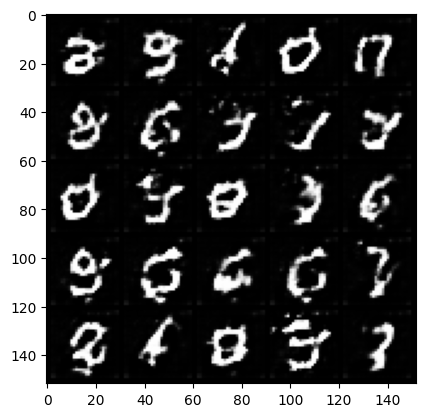

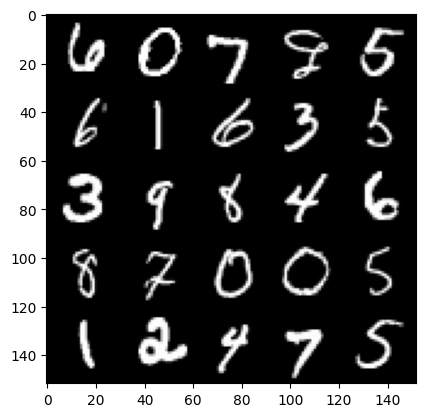

 11%|█▏        | 124/1094 [00:12<01:55,  8.39it/s]

Epoch 4, step 4500: Generator loss: 0.8451177516579621, discriminator loss: 0.6267507275342943


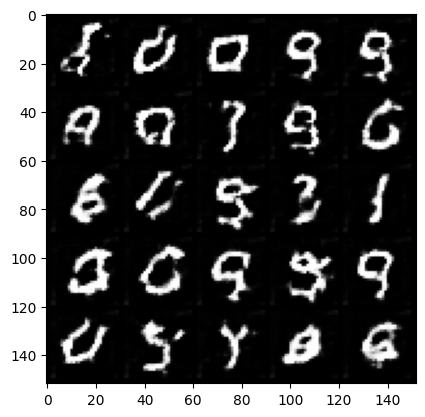

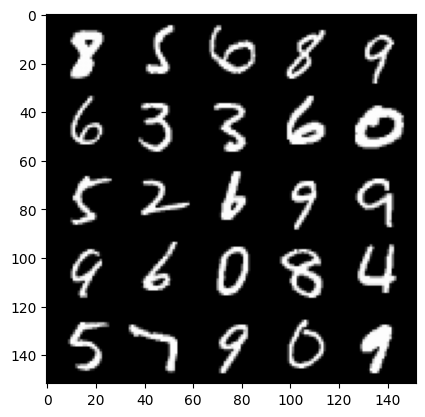

 57%|█████▋    | 624/1094 [01:03<00:48,  9.78it/s]

Epoch 4, step 5000: Generator loss: 0.8208502927422525, discriminator loss: 0.6475387575626372


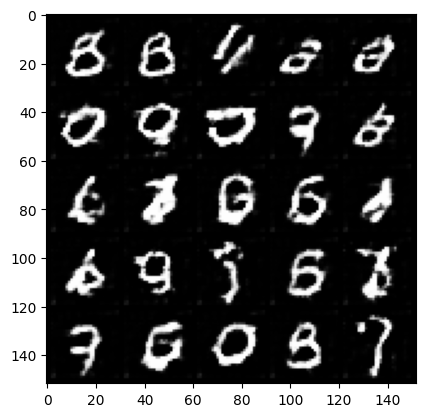

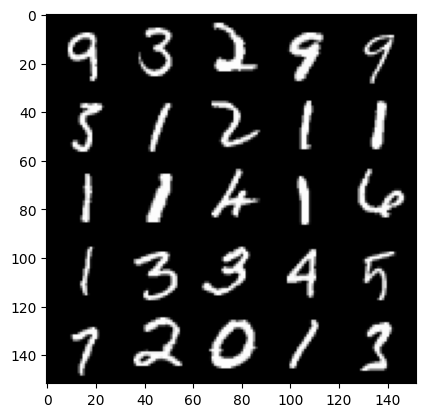

  3%|▎         | 30/1094 [00:03<01:45, 10.07it/s]

Epoch 5, step 5500: Generator loss: 0.7878538600802422, discriminator loss: 0.6595034863948825


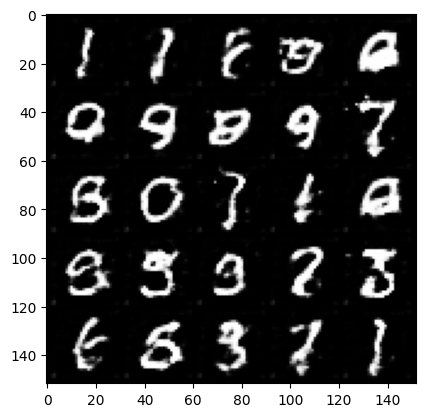

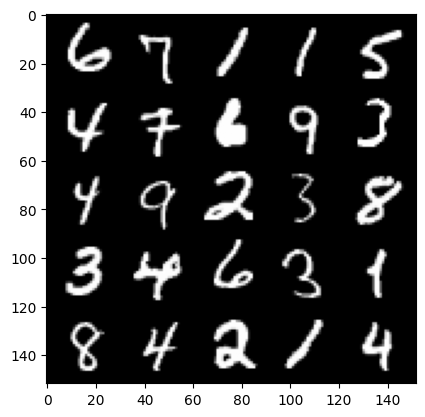

 48%|████▊     | 529/1094 [00:53<00:54, 10.36it/s]

Epoch 5, step 6000: Generator loss: 0.7859485262632376, discriminator loss: 0.6675588129758834


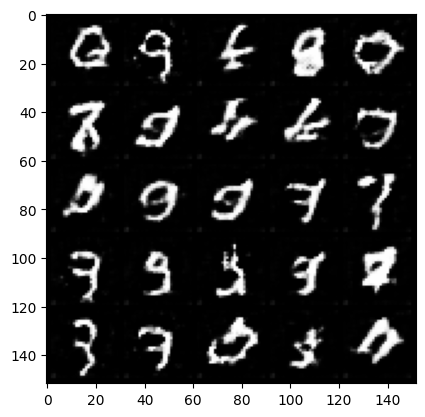

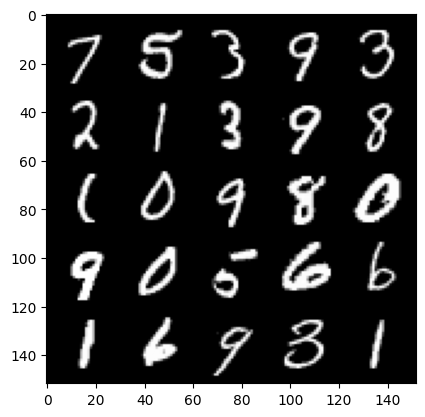

 94%|█████████▍| 1029/1094 [01:44<00:06, 10.30it/s]

Epoch 5, step 6500: Generator loss: 0.7774379695057865, discriminator loss: 0.6692118252515789


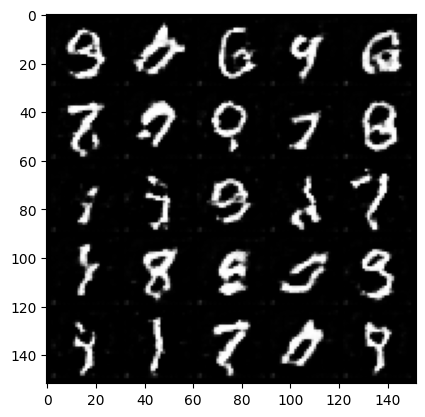

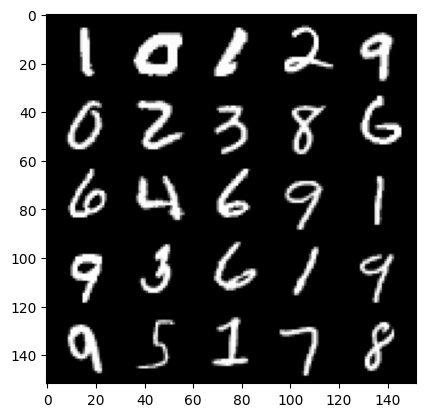

 40%|███▉      | 435/1094 [00:43<01:04, 10.27it/s]

Epoch 6, step 7000: Generator loss: 0.7702534561157232, discriminator loss: 0.6774246559143065


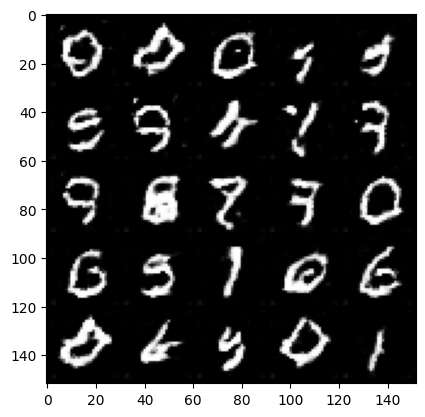

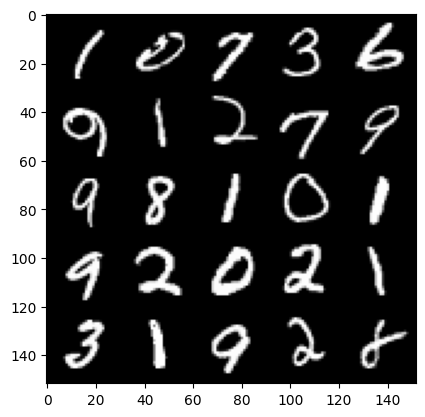

 86%|████████▌ | 936/1094 [01:37<00:15, 10.10it/s]

Epoch 6, step 7500: Generator loss: 0.7521409635543816, discriminator loss: 0.6780983675718306


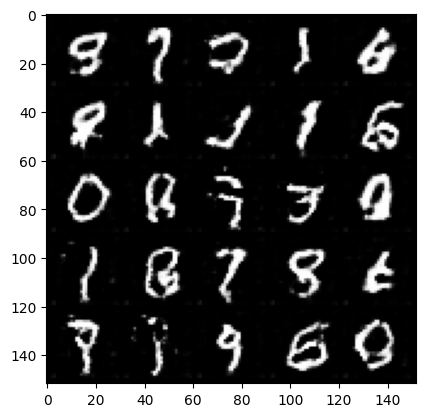

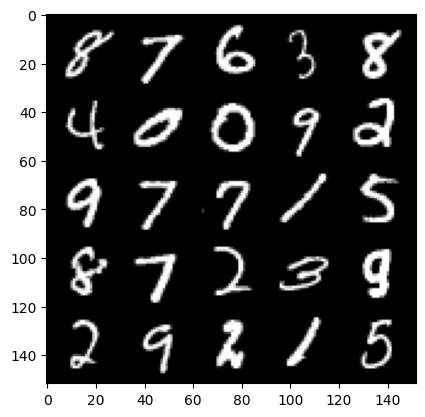

 31%|███▏      | 342/1094 [00:34<01:18,  9.55it/s]

Epoch 7, step 8000: Generator loss: 0.750959796428681, discriminator loss: 0.683266934394836


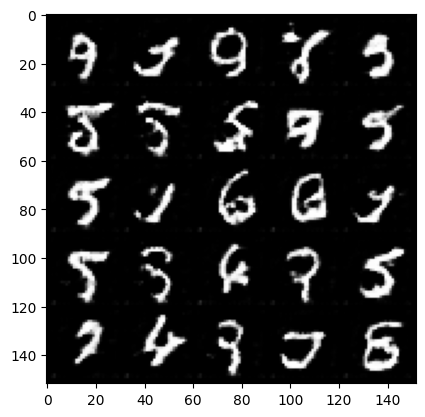

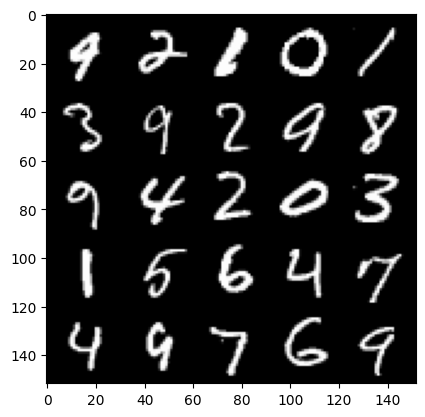

 77%|███████▋  | 842/1094 [01:26<00:26,  9.34it/s]

Epoch 7, step 8500: Generator loss: 0.7440273314118392, discriminator loss: 0.6877547847032552


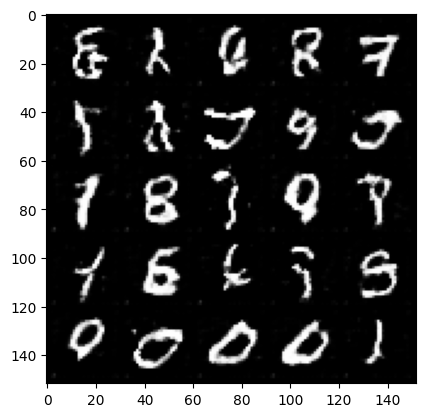

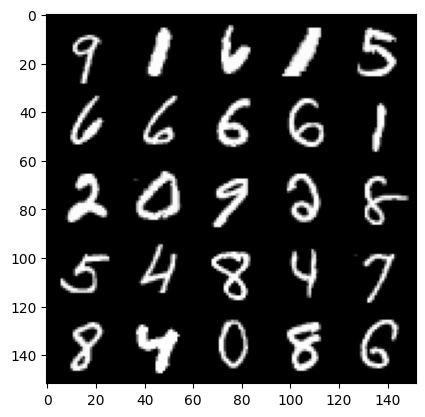

 23%|██▎       | 247/1094 [00:25<01:25,  9.85it/s]

Epoch 8, step 9000: Generator loss: 0.7404396196603781, discriminator loss: 0.6898802995681761


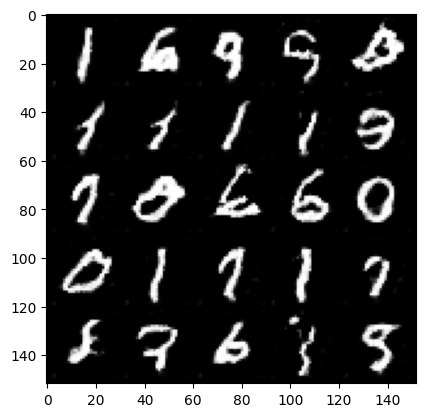

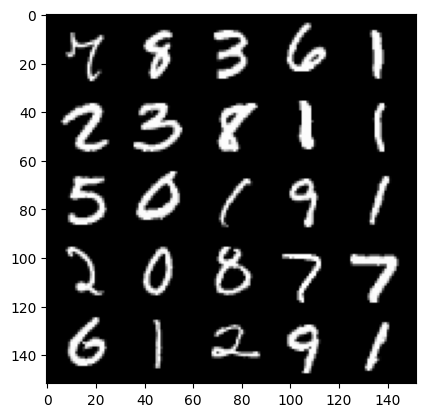

 68%|██████▊   | 748/1094 [01:16<00:34,  9.98it/s]

Epoch 8, step 9500: Generator loss: 0.7319905540943147, discriminator loss: 0.6920828706026079


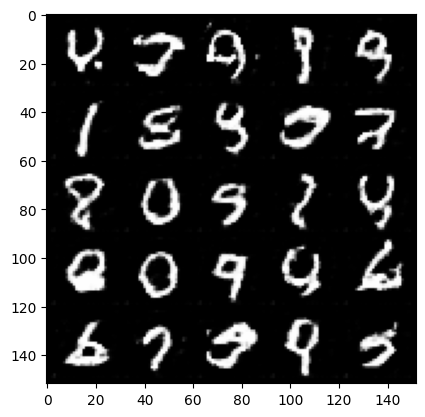

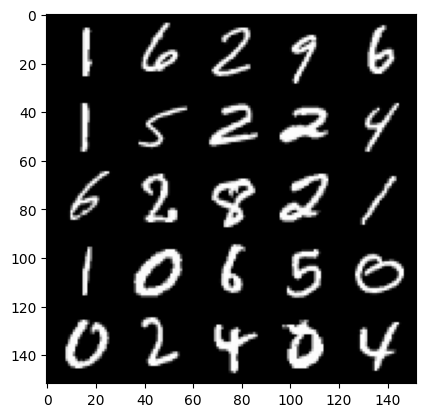

 14%|█▍        | 154/1094 [00:15<01:34,  9.98it/s]

Epoch 9, step 10000: Generator loss: 0.7277660255432125, discriminator loss: 0.6939245810508735


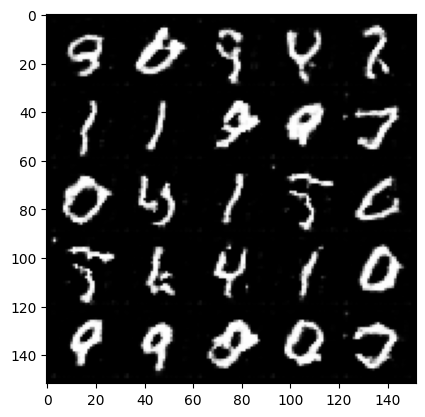

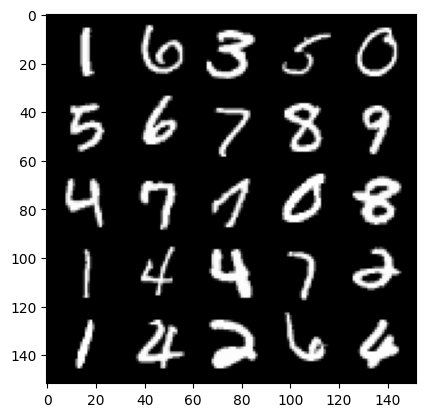

 60%|█████▉    | 653/1094 [01:05<00:42, 10.34it/s]

Epoch 9, step 10500: Generator loss: 0.7255479296445845, discriminator loss: 0.6967018972635267


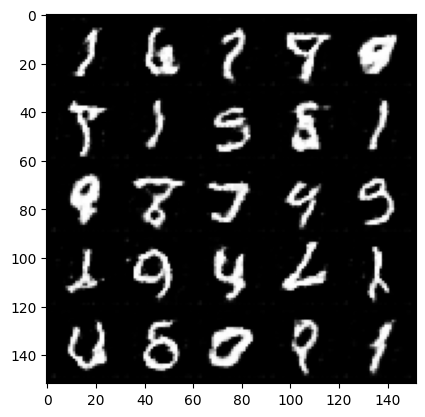

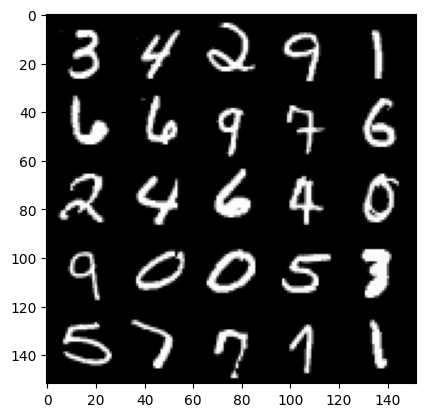

  5%|▌         | 60/1094 [00:06<01:39, 10.37it/s]

Epoch 10, step 11000: Generator loss: 0.7197421727180479, discriminator loss: 0.698482209324836


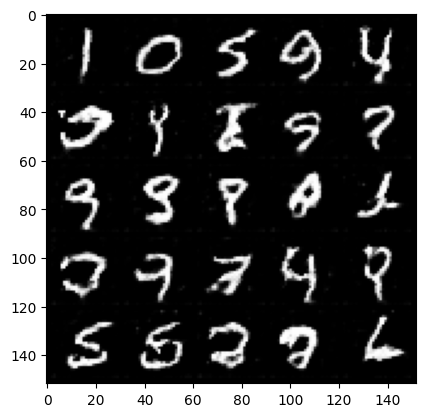

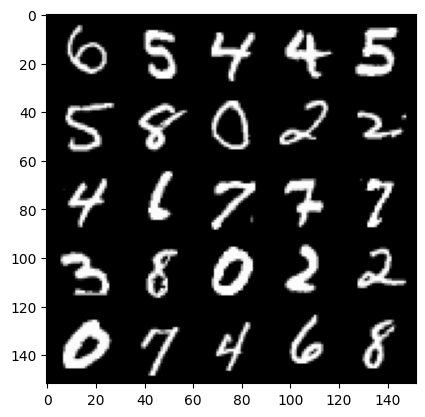

 51%|█████     | 560/1094 [00:56<00:51, 10.41it/s]

Epoch 10, step 11500: Generator loss: 0.7193633494973187, discriminator loss: 0.6993770784139628


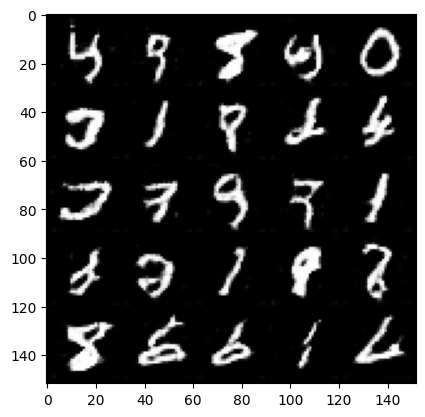

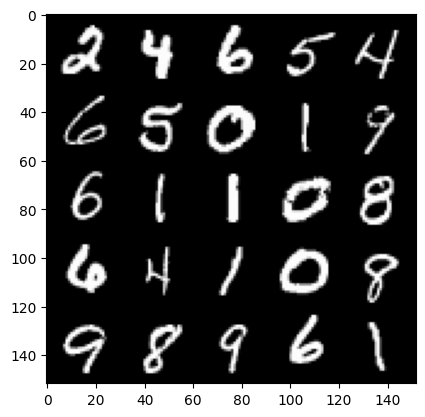

 97%|█████████▋| 1060/1094 [01:47<00:03,  9.43it/s]

Epoch 10, step 12000: Generator loss: 0.7125261849164953, discriminator loss: 0.6986541714668267


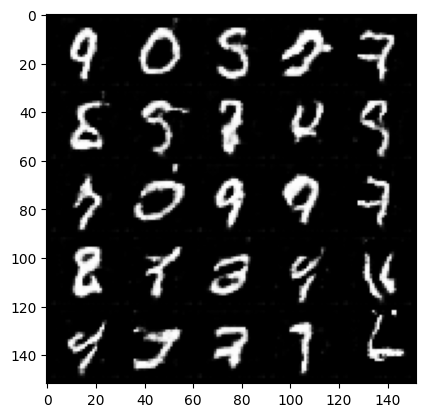

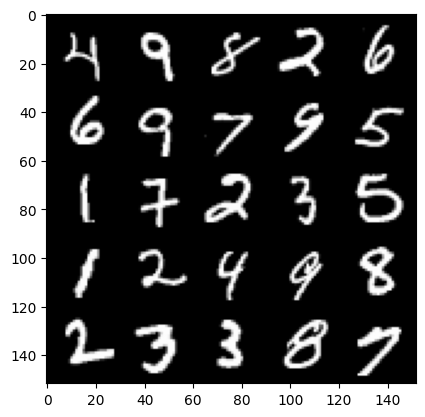

 43%|████▎     | 466/1094 [00:46<01:01, 10.28it/s]

Epoch 11, step 12500: Generator loss: 0.7108138879537585, discriminator loss: 0.6980311833620068


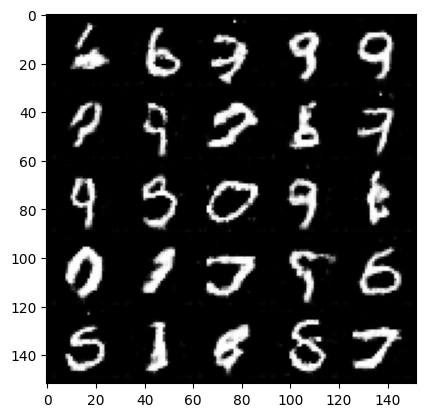

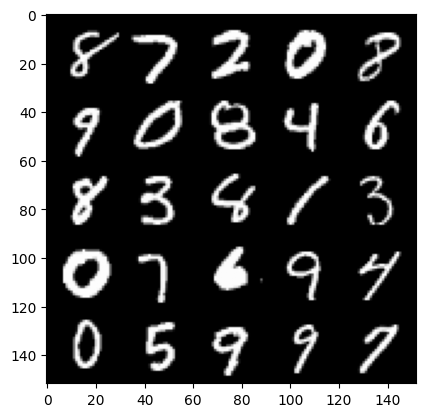

 88%|████████▊ | 966/1094 [01:37<00:12,  9.92it/s]

Epoch 11, step 13000: Generator loss: 0.7111081340312964, discriminator loss: 0.6974389855861666


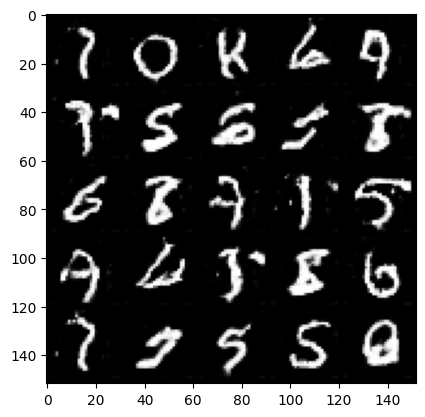

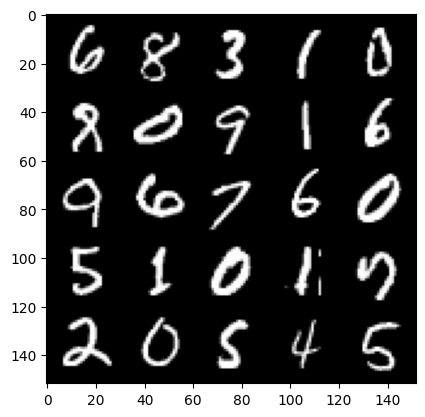

 34%|███▍      | 372/1094 [00:37<01:11, 10.05it/s]

Epoch 12, step 13500: Generator loss: 0.7103905934095386, discriminator loss: 0.6969296538829801


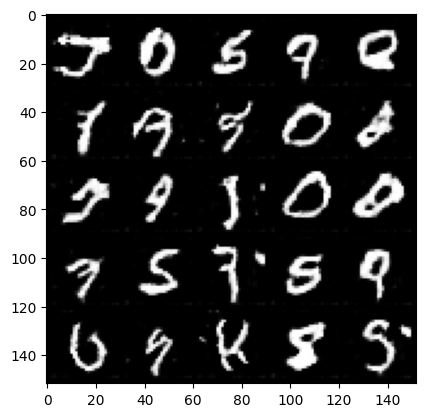

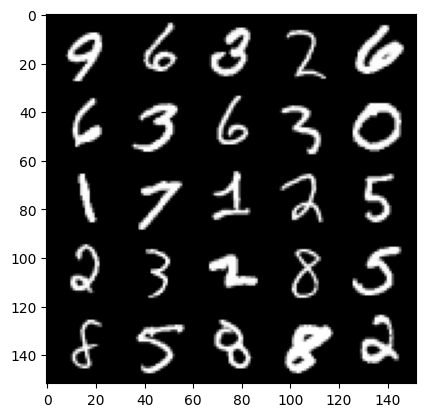

 80%|███████▉  | 872/1094 [01:29<00:22,  9.85it/s]

Epoch 12, step 14000: Generator loss: 0.7059813664555545, discriminator loss: 0.6974218730926508


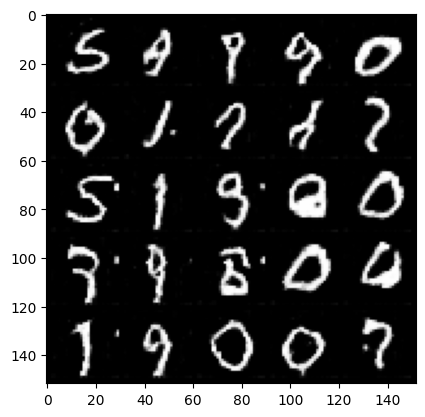

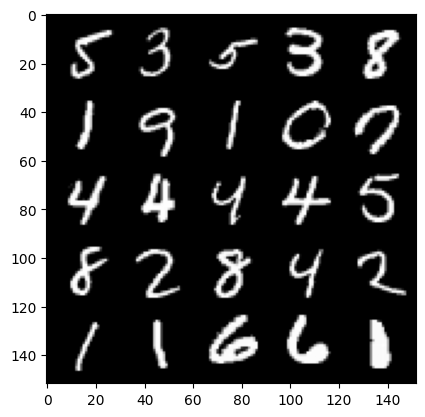

 25%|██▌       | 278/1094 [00:28<01:23,  9.79it/s]

Epoch 13, step 14500: Generator loss: 0.7072517863512039, discriminator loss: 0.6966400799751282


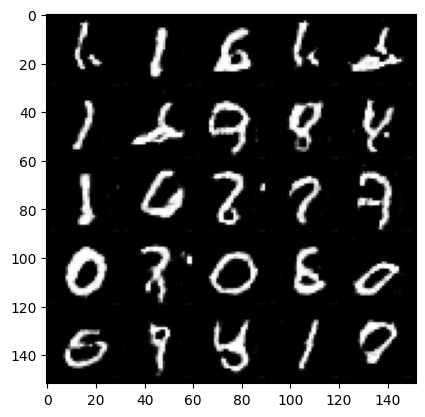

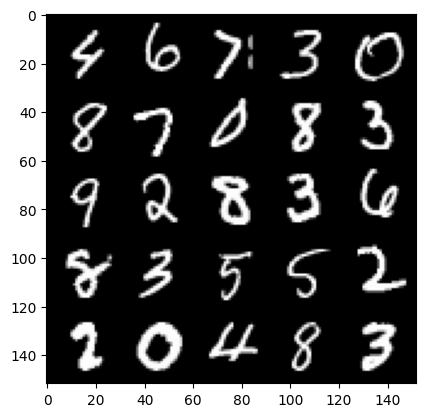

 71%|███████   | 778/1094 [01:18<00:30, 10.26it/s]

Epoch 13, step 15000: Generator loss: 0.7061671702861777, discriminator loss: 0.6975540419816973


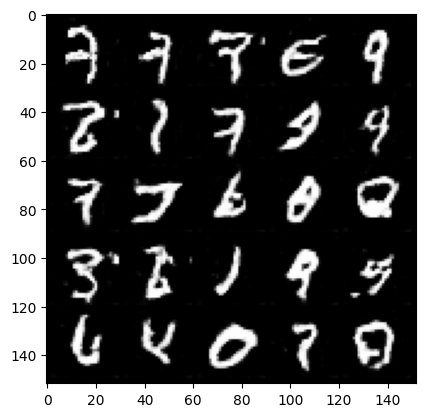

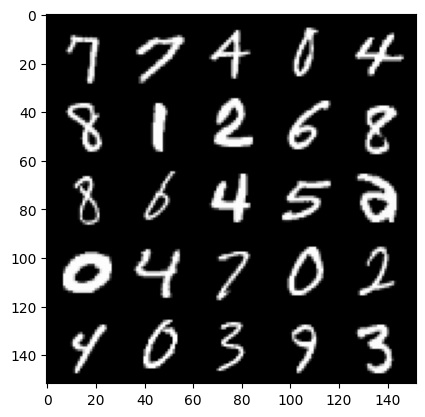

 17%|█▋        | 183/1094 [00:18<01:28, 10.26it/s]

Epoch 14, step 15500: Generator loss: 0.7065154873132713, discriminator loss: 0.6961610336303701


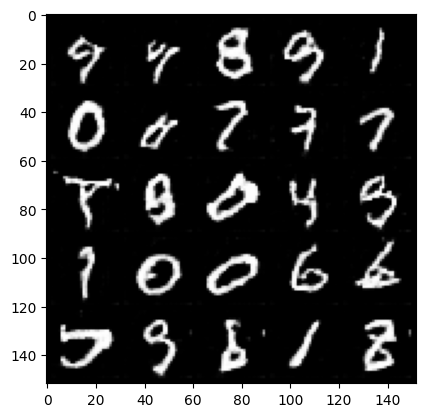

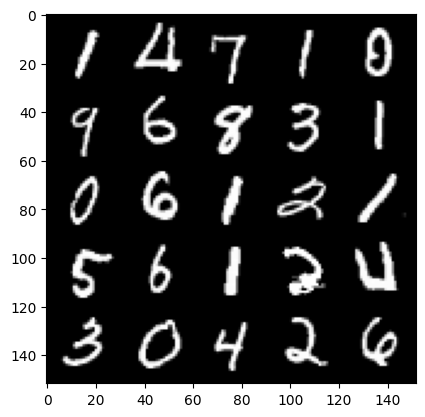

 63%|██████▎   | 684/1094 [01:08<00:42,  9.65it/s]

Epoch 14, step 16000: Generator loss: 0.7005049084722998, discriminator loss: 0.6990202492475509


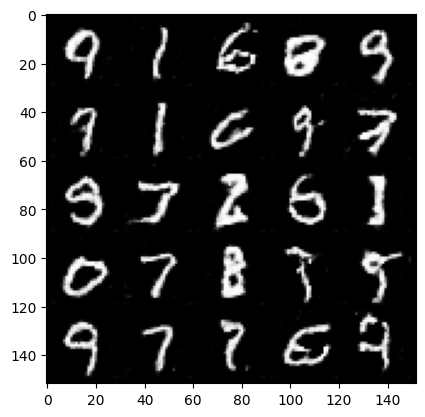

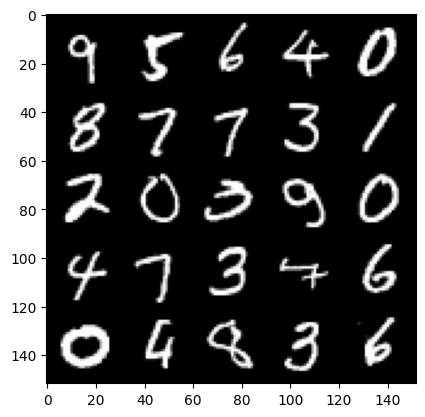

  8%|▊         | 90/1094 [00:08<01:37, 10.26it/s]

Epoch 15, step 16500: Generator loss: 0.6988607562780376, discriminator loss: 0.697868620157242


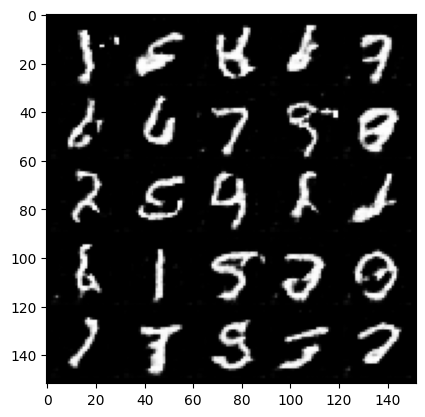

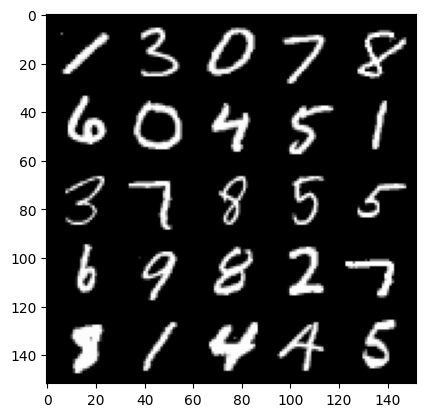

 54%|█████▍    | 589/1094 [01:00<00:50, 10.07it/s]

Epoch 15, step 17000: Generator loss: 0.7029726189970968, discriminator loss: 0.6974402991533281


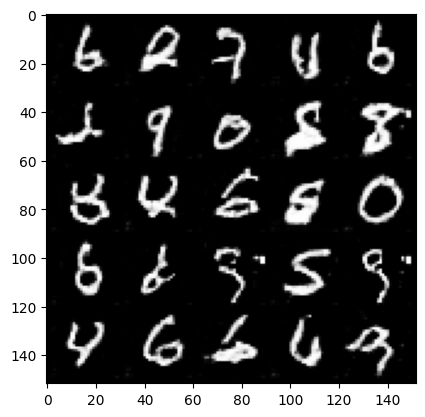

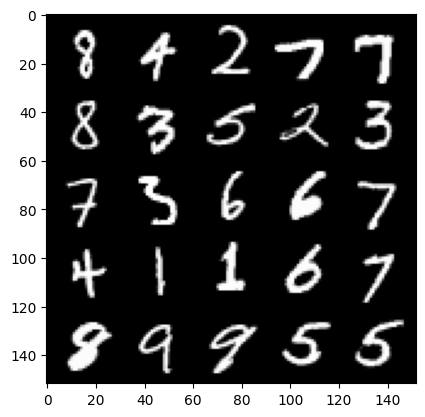

100%|█████████▉| 1090/1094 [01:51<00:00, 10.47it/s]

Epoch 15, step 17500: Generator loss: 0.7029492595195774, discriminator loss: 0.6964603748321522


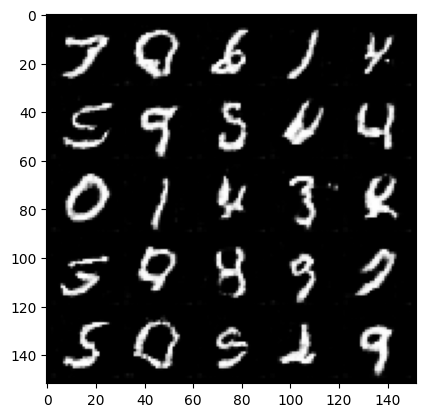

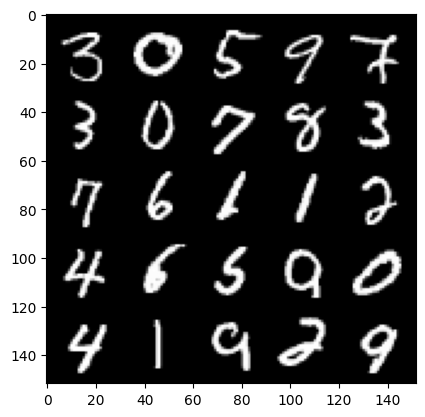

 45%|████▌     | 496/1094 [00:50<01:01,  9.72it/s]

Epoch 16, step 18000: Generator loss: 0.7031630573868759, discriminator loss: 0.6958187932968137


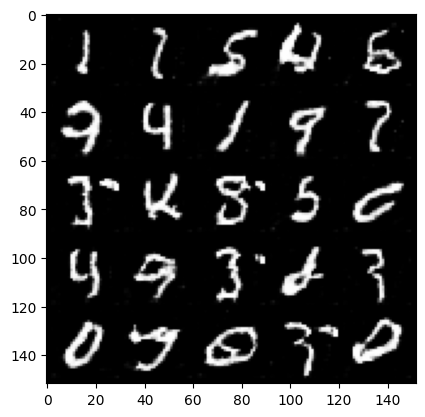

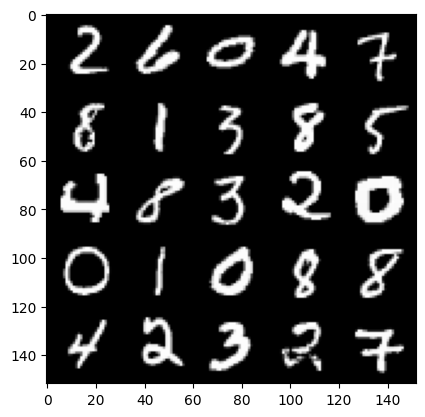

 91%|█████████ | 996/1094 [01:40<00:10,  9.59it/s]

Epoch 16, step 18500: Generator loss: 0.7024176536202434, discriminator loss: 0.6956870802640904


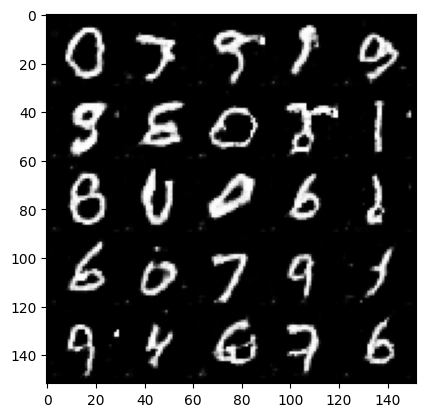

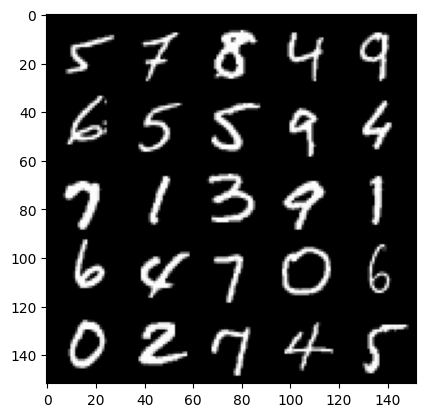

 37%|███▋      | 401/1094 [00:42<01:06, 10.37it/s]

Epoch 17, step 19000: Generator loss: 0.7040206791162488, discriminator loss: 0.6956623704433438


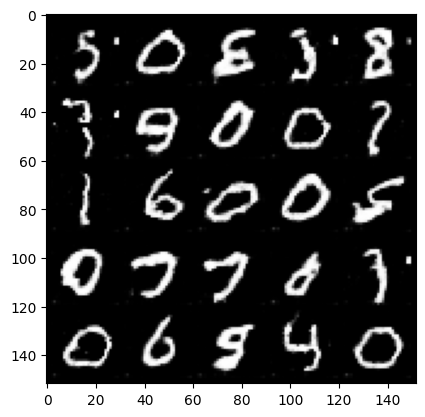

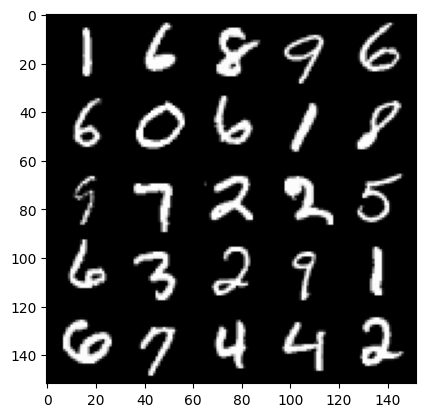

 82%|████████▏ | 901/1094 [01:34<00:19,  9.94it/s]

Epoch 17, step 19500: Generator loss: 0.7010161303281786, discriminator loss: 0.696304672241211


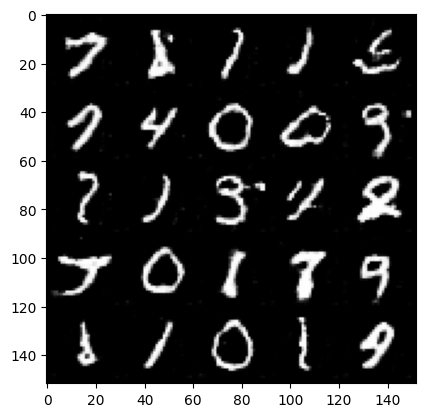

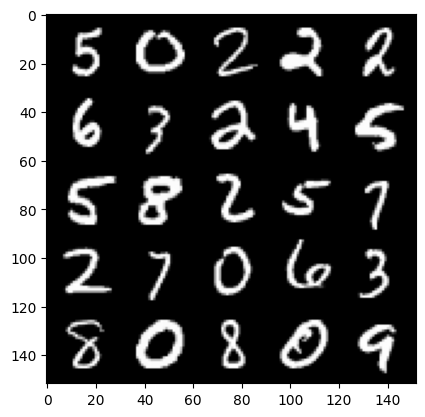

 28%|██▊       | 308/1094 [00:32<01:17, 10.09it/s]

Epoch 18, step 20000: Generator loss: 0.7011670225858686, discriminator loss: 0.6955033305883414


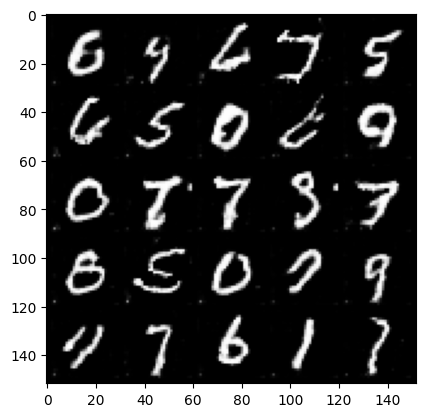

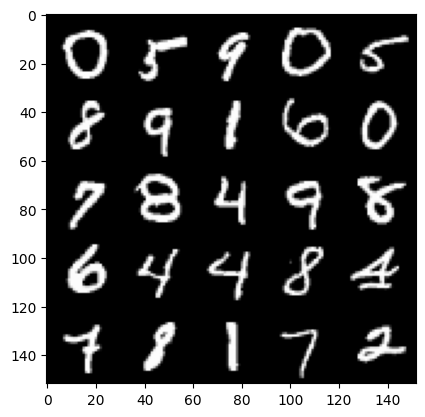

 74%|███████▍  | 807/1094 [01:24<00:29,  9.72it/s]

Epoch 18, step 20500: Generator loss: 0.7006030950546265, discriminator loss: 0.6957229462862017


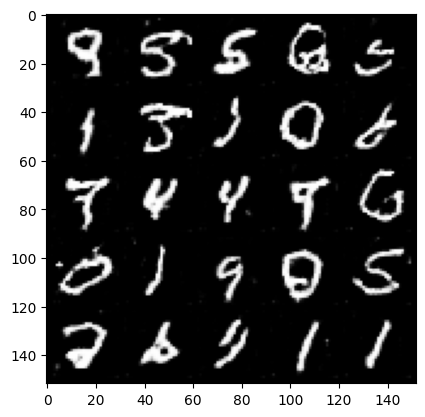

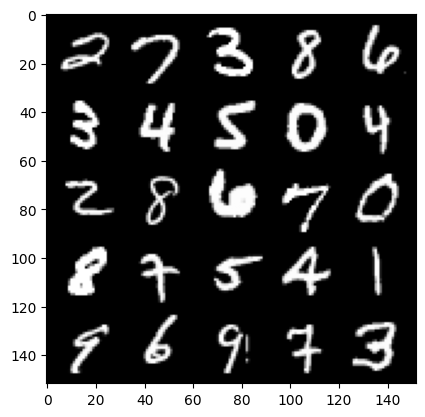

 20%|█▉        | 214/1094 [00:24<01:30,  9.77it/s]

Epoch 19, step 21000: Generator loss: 0.7013642427921296, discriminator loss: 0.6946574312448502


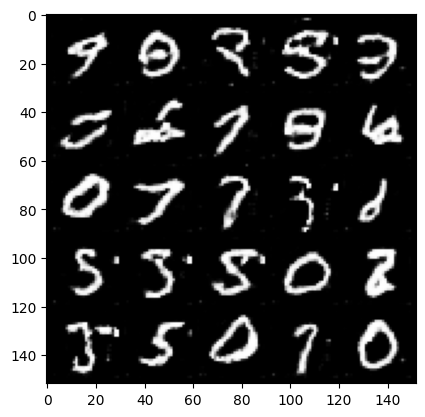

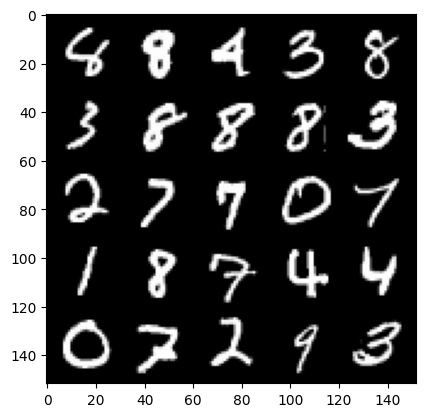

 65%|██████▌   | 713/1094 [01:15<00:37, 10.29it/s]

Epoch 19, step 21500: Generator loss: 0.697862333476543, discriminator loss: 0.6965501137971887


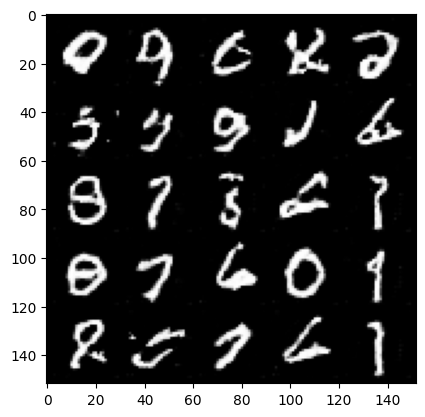

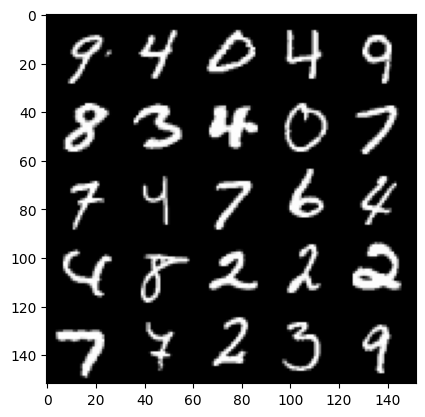

 11%|█         | 119/1094 [00:12<01:38,  9.88it/s]

Epoch 20, step 22000: Generator loss: 0.7018724167346952, discriminator loss: 0.6948090397119517


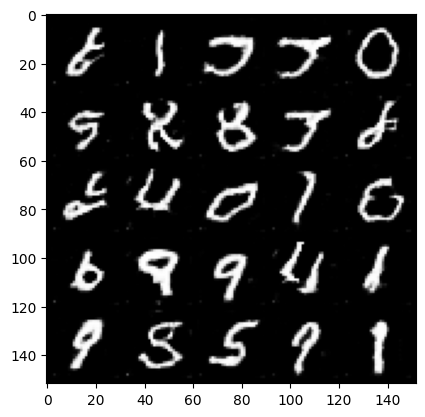

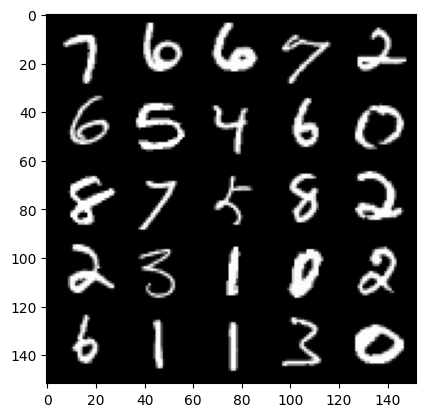

 57%|█████▋    | 620/1094 [01:02<00:45, 10.43it/s]

Epoch 20, step 22500: Generator loss: 0.7008014843463899, discriminator loss: 0.6948693926334374


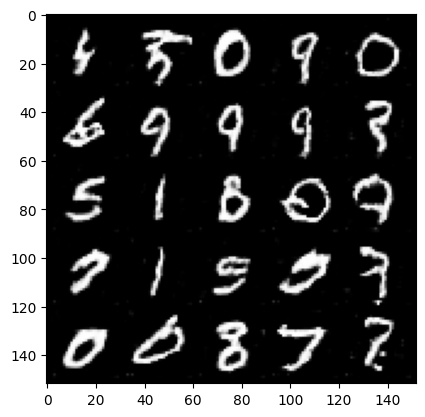

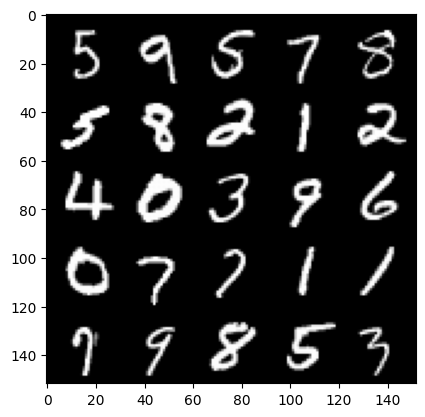

  2%|▏         | 25/1094 [00:02<01:44, 10.25it/s]

Epoch 21, step 23000: Generator loss: 0.6968717973232271, discriminator loss: 0.6970156775712965


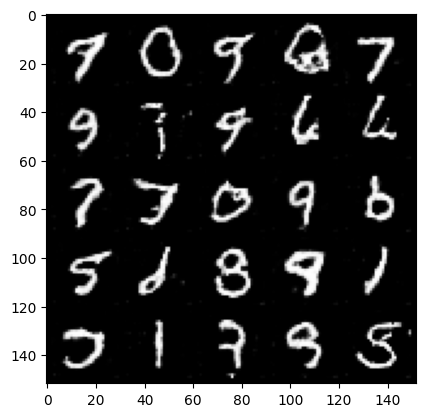

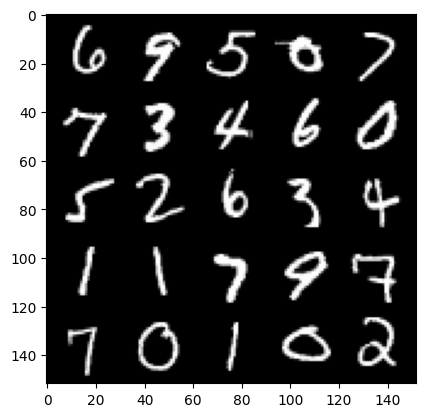

 48%|████▊     | 526/1094 [00:54<00:58,  9.74it/s]

Epoch 21, step 23500: Generator loss: 0.6977262130975719, discriminator loss: 0.6952369291782384


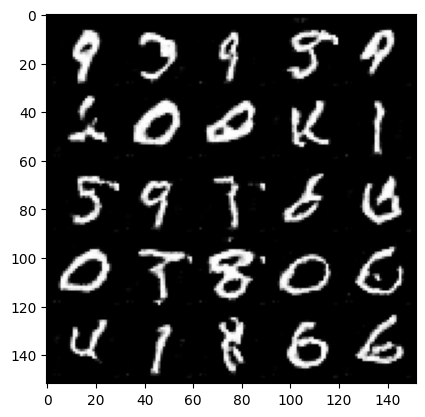

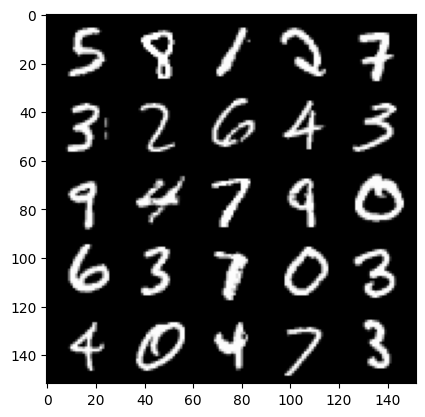

 94%|█████████▍| 1026/1094 [01:47<00:07,  8.98it/s]

Epoch 21, step 24000: Generator loss: 0.7001675382852552, discriminator loss: 0.6947737612724298


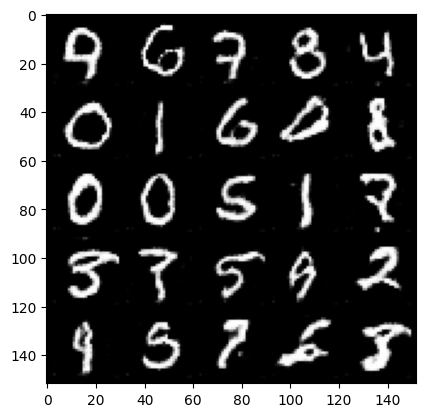

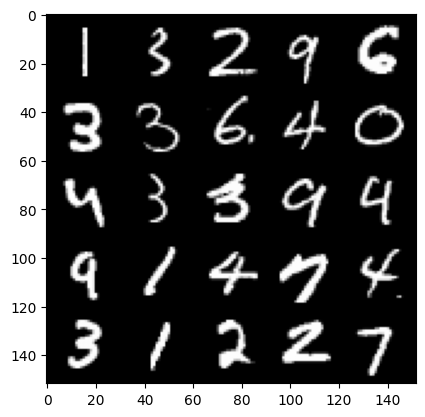

 39%|███▉      | 431/1094 [00:43<01:08,  9.67it/s]

Epoch 22, step 24500: Generator loss: 0.7004016394615172, discriminator loss: 0.6943217065334316


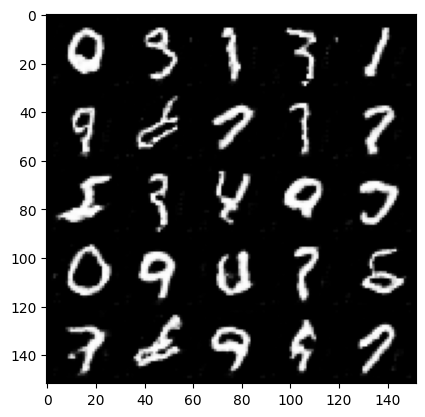

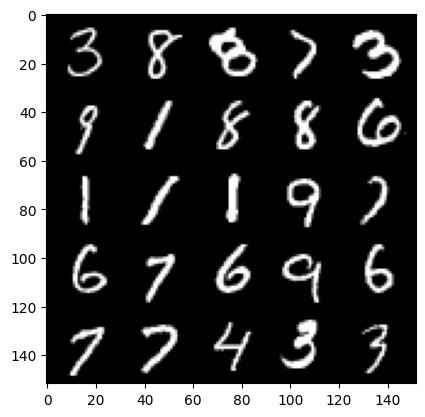

 85%|████████▌ | 932/1094 [01:38<00:16,  9.93it/s]

Epoch 22, step 25000: Generator loss: 0.6990210137367249, discriminator loss: 0.694562693715095


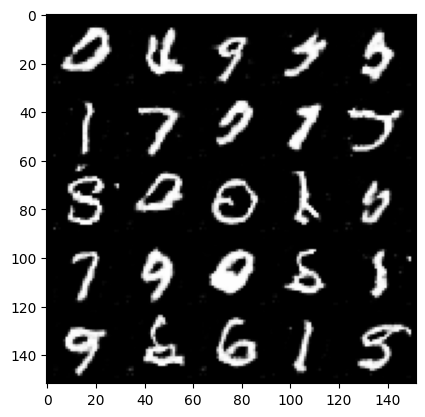

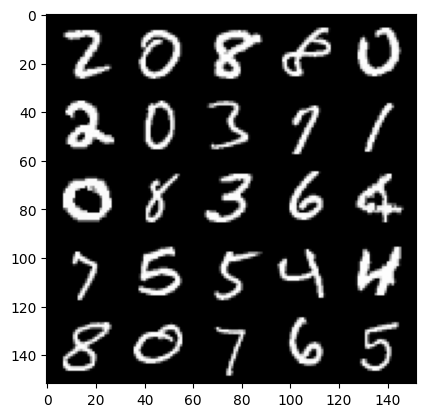

 31%|███       | 337/1094 [00:40<01:15, 10.03it/s]

Epoch 23, step 25500: Generator loss: 0.6984246518611913, discriminator loss: 0.6940902942419057


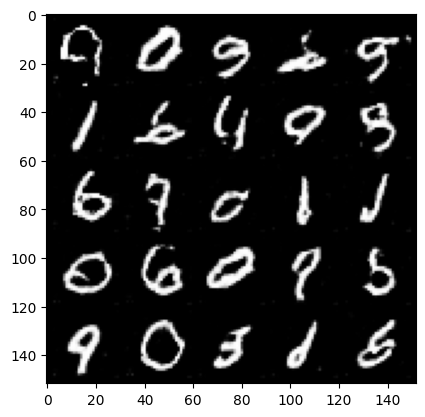

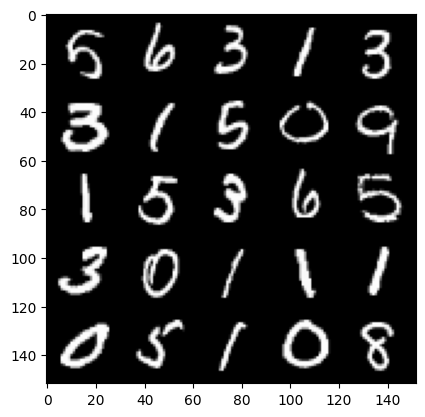

 77%|███████▋  | 838/1094 [01:31<00:29,  8.80it/s]

Epoch 23, step 26000: Generator loss: 0.7003920537233354, discriminator loss: 0.694635481715202


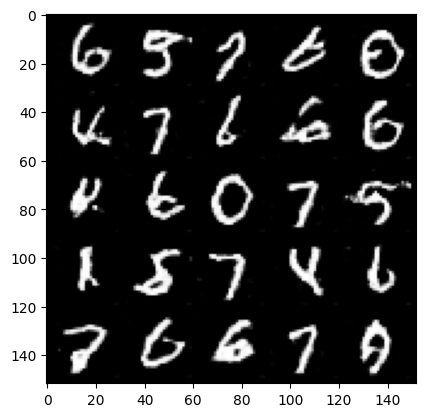

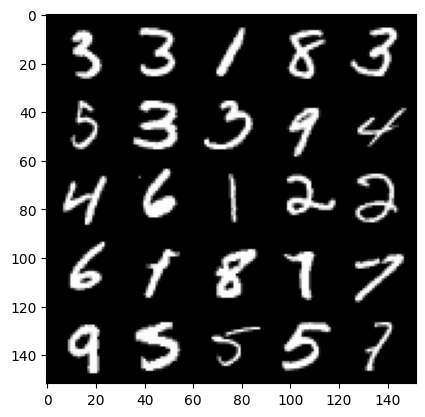

 22%|██▏       | 243/1094 [00:26<01:21, 10.42it/s]

Epoch 24, step 26500: Generator loss: 0.6982671358585357, discriminator loss: 0.6942890621423727


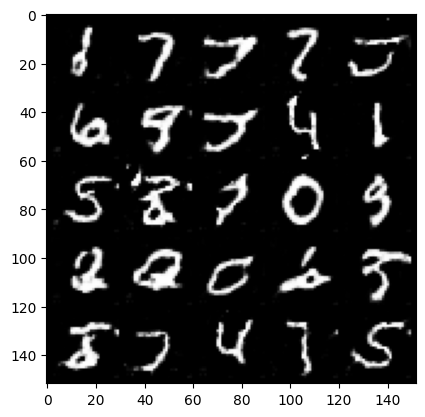

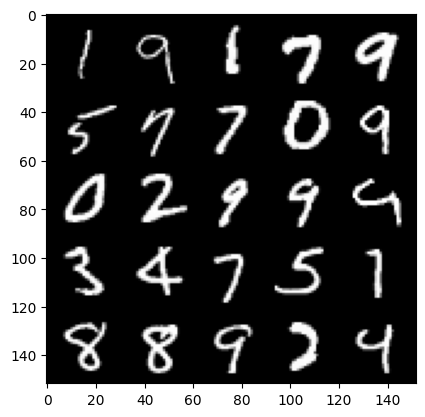

 68%|██████▊   | 744/1094 [01:19<01:05,  5.37it/s]

Epoch 24, step 27000: Generator loss: 0.6995136741399767, discriminator loss: 0.6941724394559856


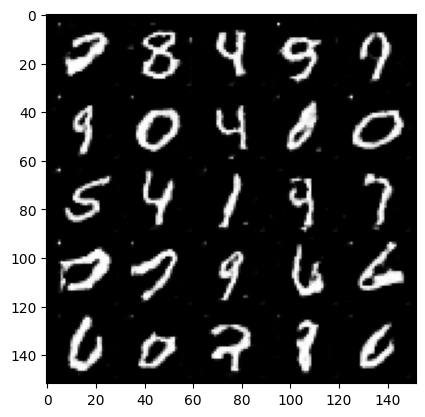

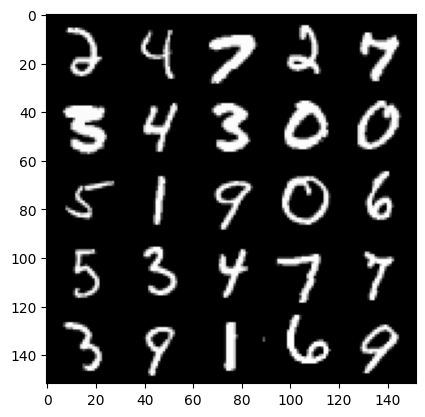

 14%|█▎        | 150/1094 [00:17<01:53,  8.28it/s]

Epoch 25, step 27500: Generator loss: 0.698774607896805, discriminator loss: 0.6939513106346129


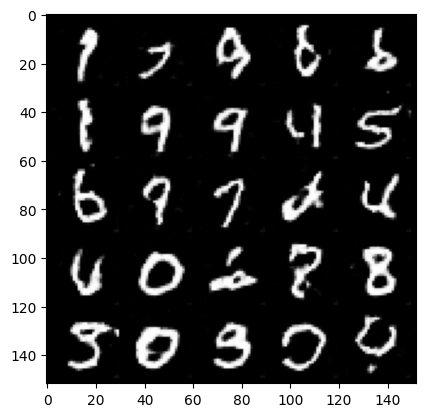

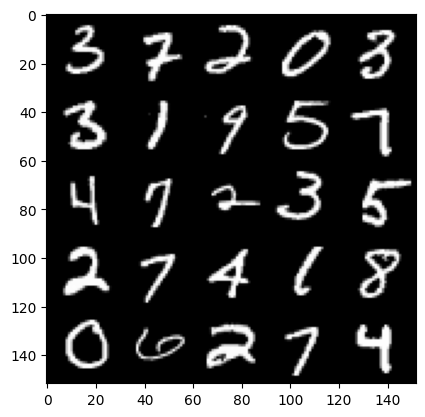

 59%|█████▉    | 650/1094 [01:17<00:46,  9.63it/s]

Epoch 25, step 28000: Generator loss: 0.6982853779196742, discriminator loss: 0.6943815994262694


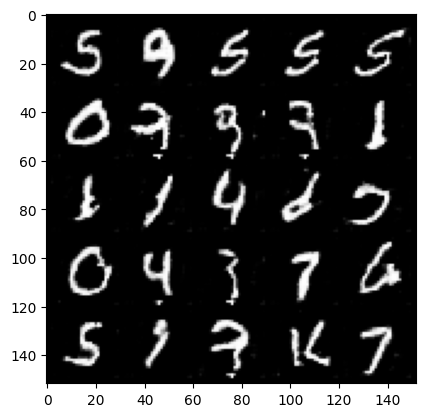

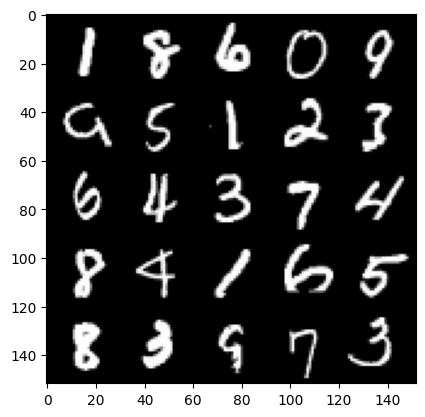

  5%|▌         | 56/1094 [00:06<02:03,  8.42it/s]

Epoch 26, step 28500: Generator loss: 0.6980878580212591, discriminator loss: 0.6941913802623751


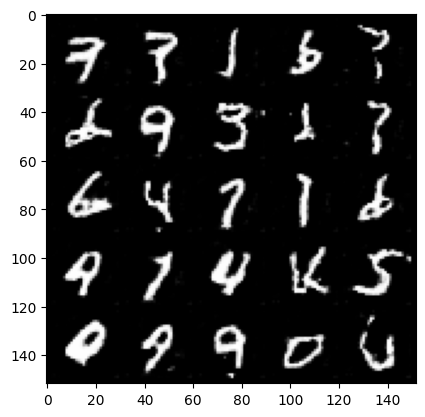

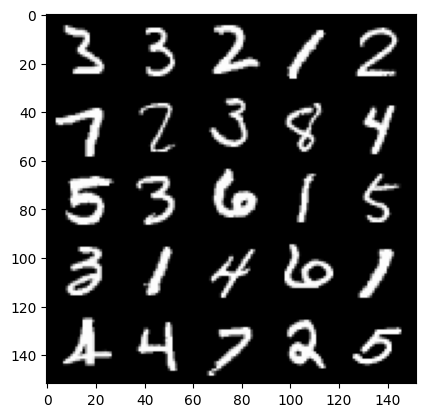

 51%|█████     | 556/1094 [01:06<01:02,  8.54it/s]

Epoch 26, step 29000: Generator loss: 0.6982889269590377, discriminator loss: 0.6943823149204255


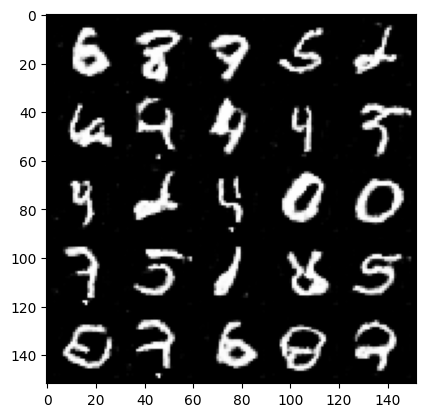

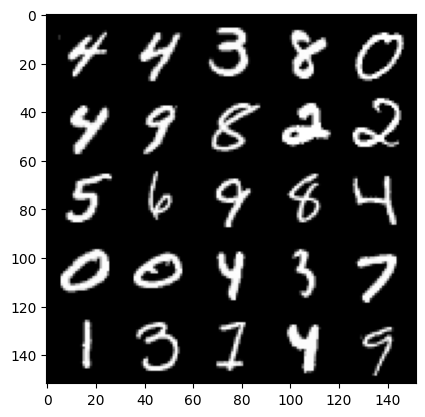

 97%|█████████▋| 1056/1094 [02:05<00:04,  8.10it/s]

Epoch 26, step 29500: Generator loss: 0.6985934100151066, discriminator loss: 0.6939703903198241


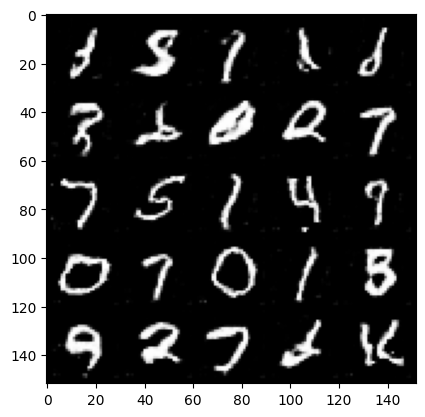

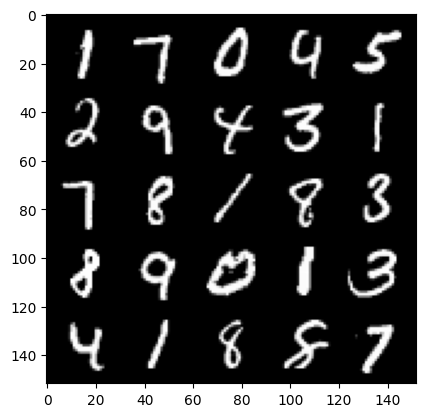

 42%|████▏     | 462/1094 [00:54<01:11,  8.84it/s]

Epoch 27, step 30000: Generator loss: 0.6979875093698503, discriminator loss: 0.6941693757772447


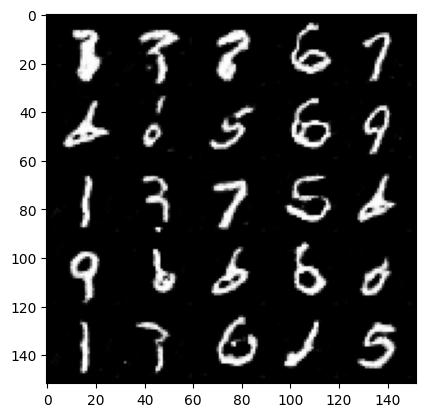

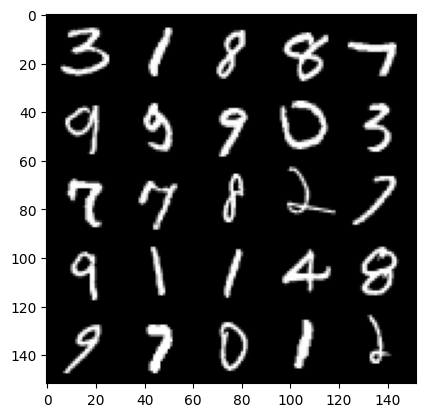

 88%|████████▊ | 962/1094 [01:55<00:16,  8.10it/s]

Epoch 27, step 30500: Generator loss: 0.6978815110921857, discriminator loss: 0.6942216320037842


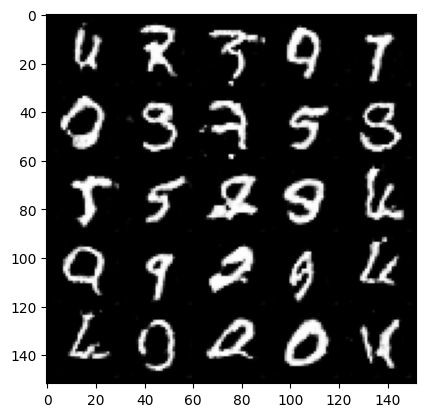

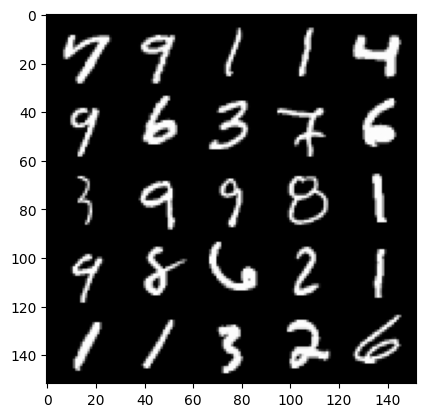

 34%|███▎      | 368/1094 [00:43<01:24,  8.60it/s]

Epoch 28, step 31000: Generator loss: 0.6979020861387248, discriminator loss: 0.6942210359573365


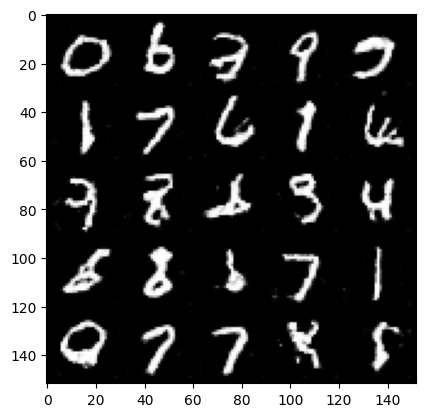

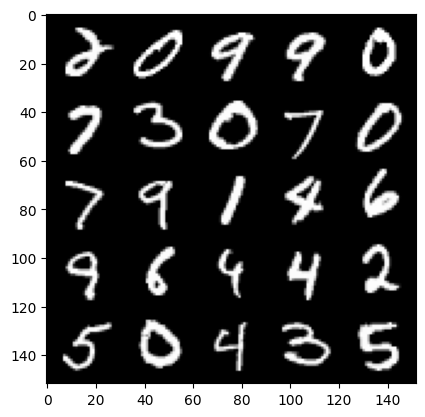

 79%|███████▉  | 868/1094 [01:43<00:27,  8.27it/s]

Epoch 28, step 31500: Generator loss: 0.697238043785096, discriminator loss: 0.6941366541385653


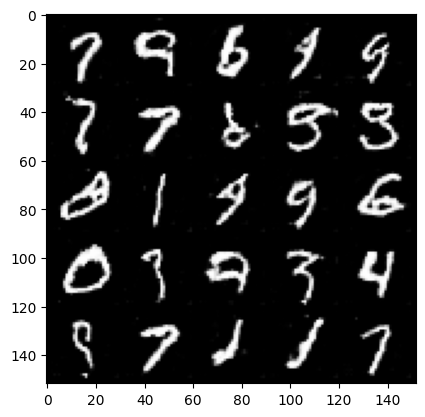

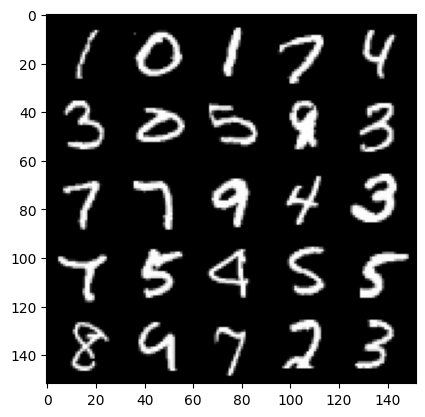

 25%|██▌       | 274/1094 [00:32<01:35,  8.59it/s]

Epoch 29, step 32000: Generator loss: 0.6969818665981293, discriminator loss: 0.6941915359497074


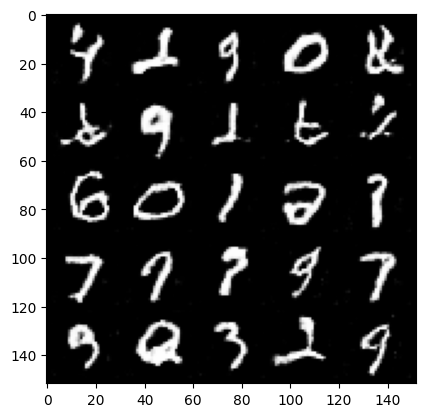

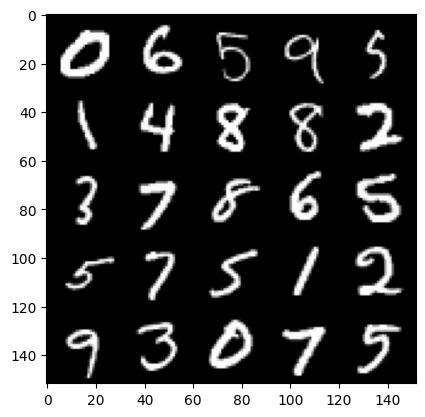

 71%|███████   | 774/1094 [01:32<00:36,  8.73it/s]

Epoch 29, step 32500: Generator loss: 0.6970670022964475, discriminator loss: 0.6942594070434569


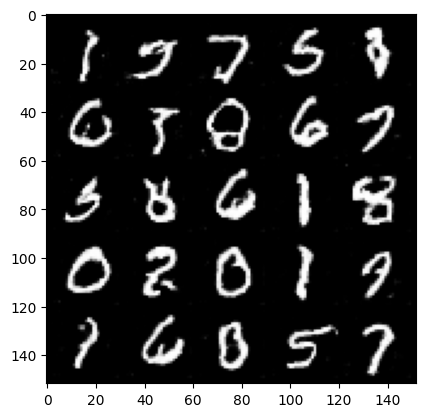

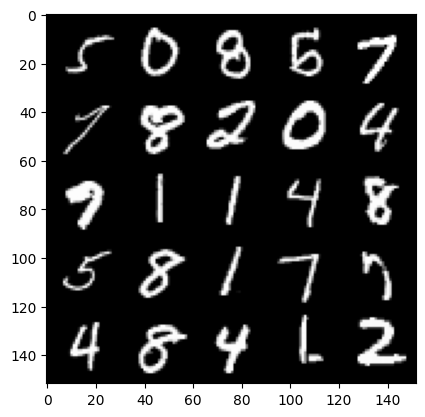

 16%|█▋        | 180/1094 [00:21<01:51,  8.16it/s]

Epoch 30, step 33000: Generator loss: 0.6971540433168414, discriminator loss: 0.6943476580381395


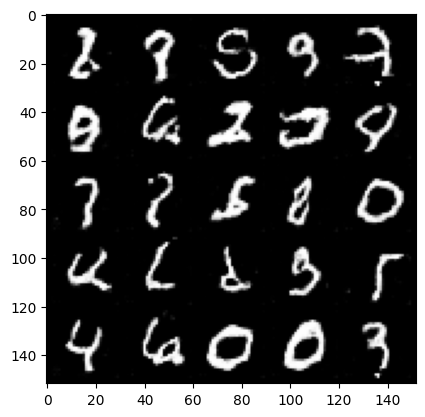

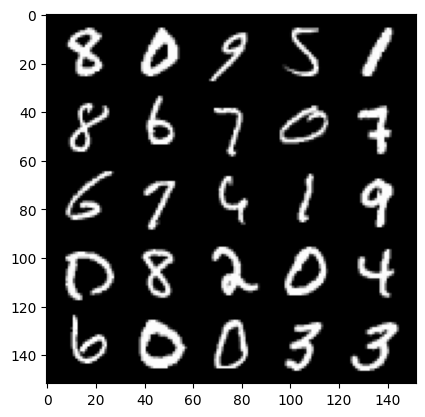

 62%|██████▏   | 680/1094 [01:21<00:51,  8.10it/s]

Epoch 30, step 33500: Generator loss: 0.6965266269445417, discriminator loss: 0.6941326136589047


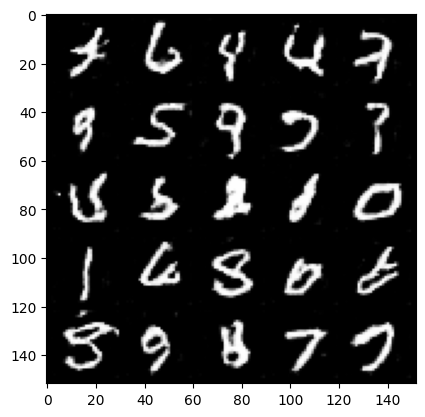

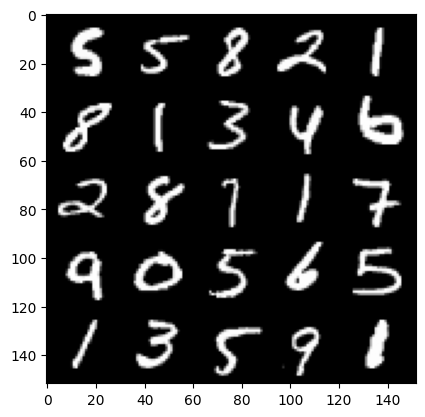

  8%|▊         | 86/1094 [00:10<01:59,  8.45it/s]

Epoch 31, step 34000: Generator loss: 0.6963245034217838, discriminator loss: 0.6942978948354724


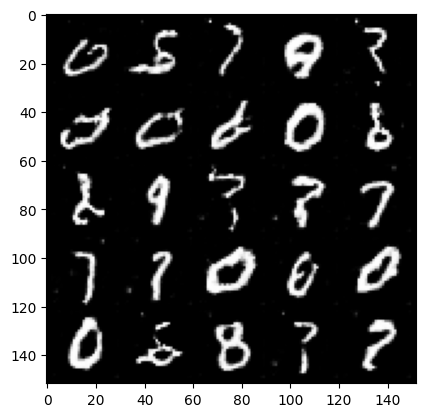

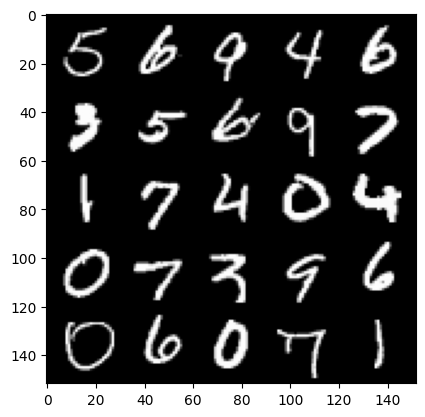

 54%|█████▎    | 586/1094 [01:12<01:00,  8.44it/s]

Epoch 31, step 34500: Generator loss: 0.6965163828134529, discriminator loss: 0.6941756290197367


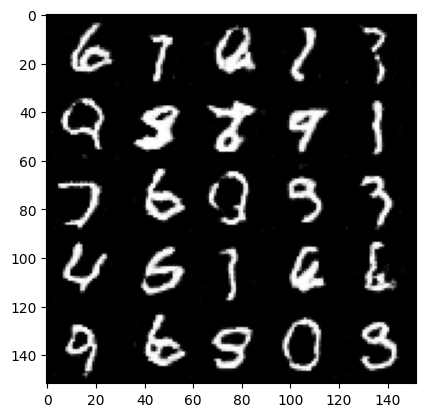

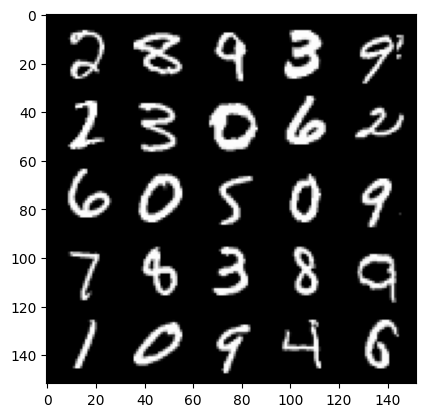

 99%|█████████▉| 1086/1094 [02:11<00:00,  8.75it/s]

Epoch 31, step 35000: Generator loss: 0.6965321791172022, discriminator loss: 0.6943581235408782


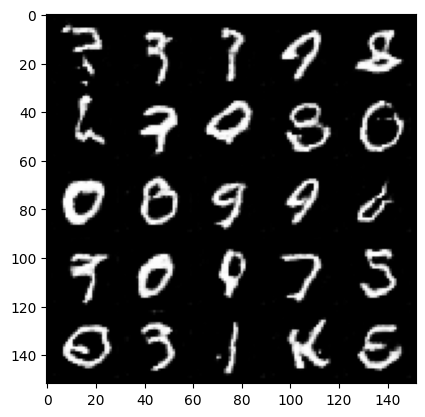

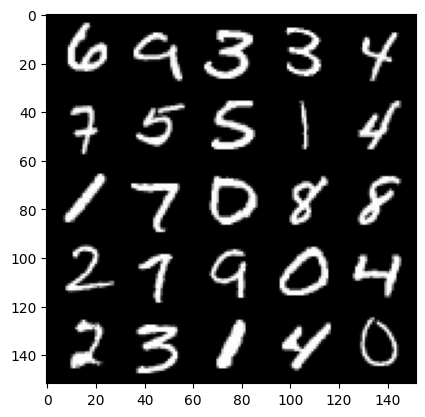

 45%|████▍     | 492/1094 [00:57<01:10,  8.50it/s]

Epoch 32, step 35500: Generator loss: 0.6962805373668672, discriminator loss: 0.6942289191484454


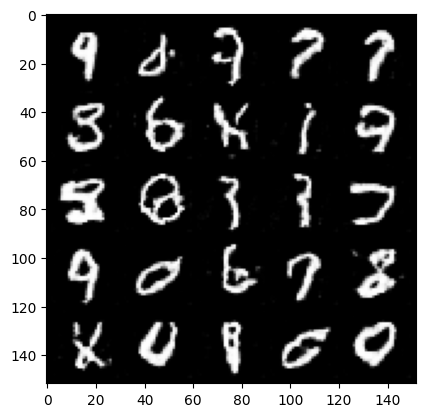

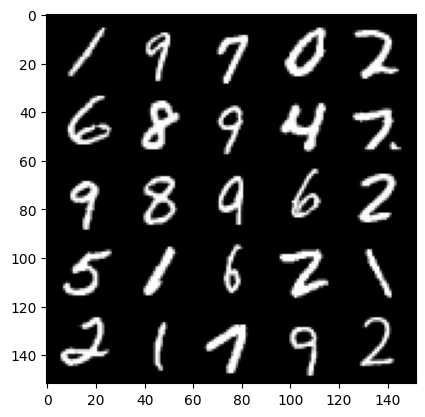

 91%|█████████ | 992/1094 [01:57<00:11,  8.57it/s]

Epoch 32, step 36000: Generator loss: 0.6962856979370123, discriminator loss: 0.6942041959762578


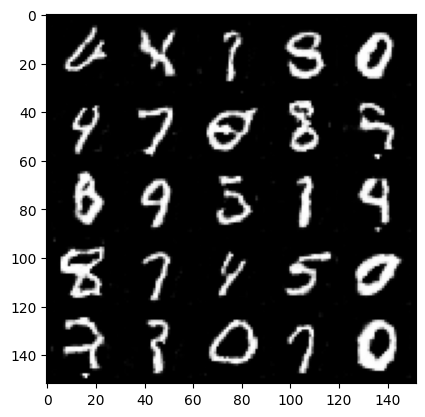

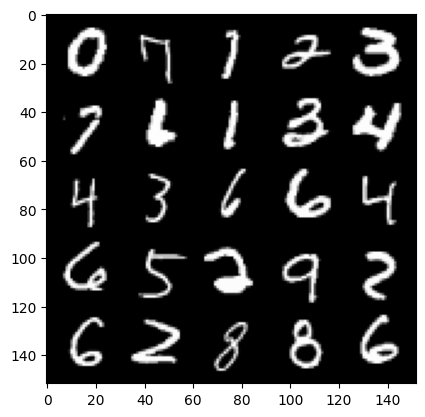

 36%|███▋      | 398/1094 [00:46<01:21,  8.52it/s]

Epoch 33, step 36500: Generator loss: 0.6968206698894498, discriminator loss: 0.6943987365961077


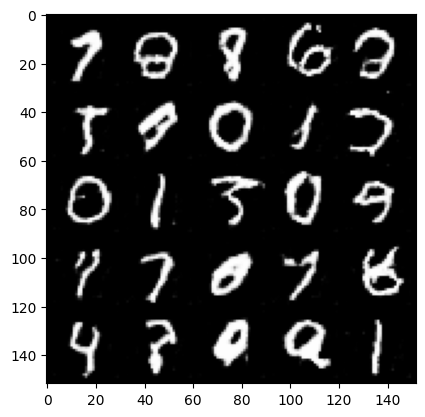

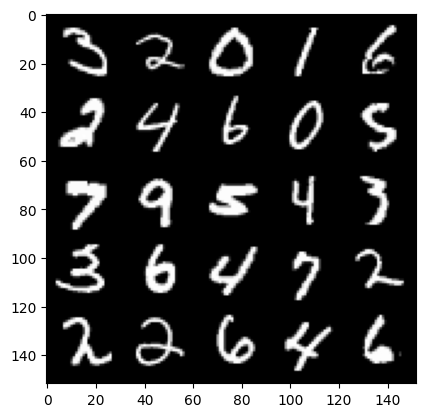

 82%|████████▏ | 898/1094 [01:45<00:24,  8.15it/s]

Epoch 33, step 37000: Generator loss: 0.6958196815252304, discriminator loss: 0.6941561044454568


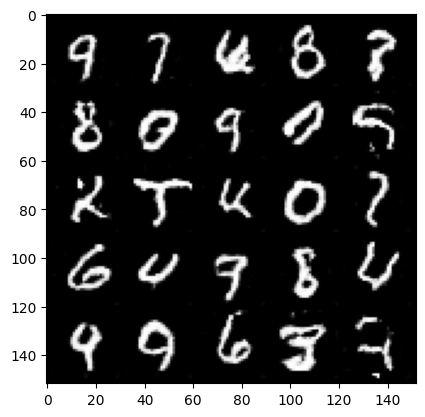

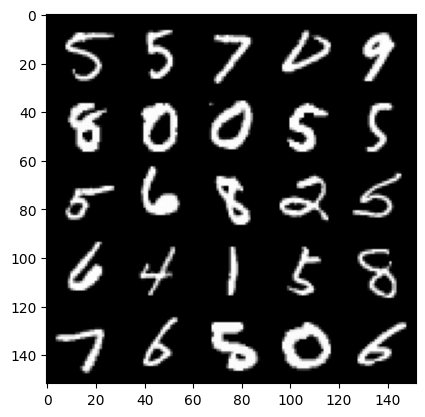

 28%|██▊       | 304/1094 [00:35<01:29,  8.83it/s]

Epoch 34, step 37500: Generator loss: 0.696083403587342, discriminator loss: 0.6942102873325345


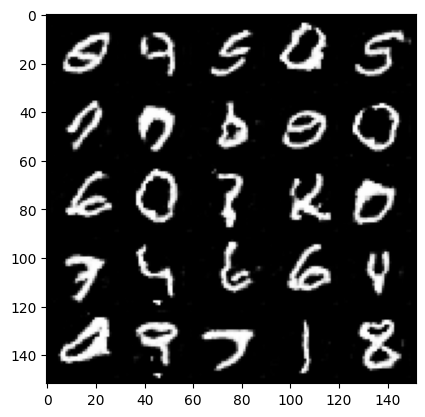

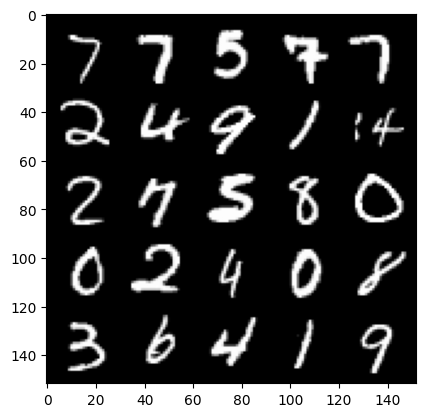

 73%|███████▎  | 804/1094 [01:35<00:35,  8.21it/s]

Epoch 34, step 38000: Generator loss: 0.6957425587177272, discriminator loss: 0.6940726788043974


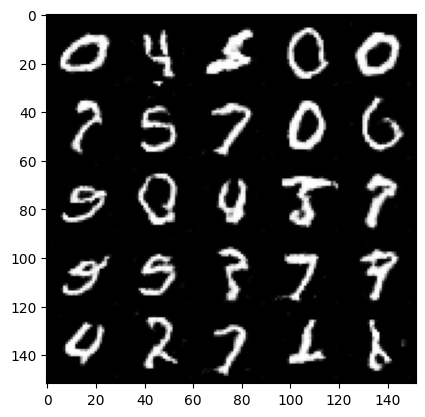

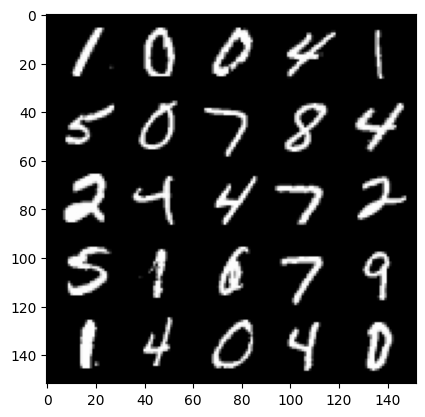

 19%|█▉        | 210/1094 [00:24<01:43,  8.51it/s]

Epoch 35, step 38500: Generator loss: 0.6956430703401565, discriminator loss: 0.6941578093767168


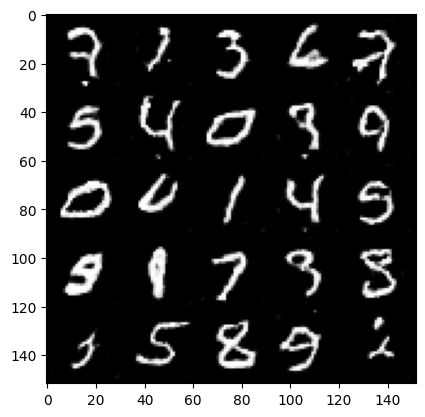

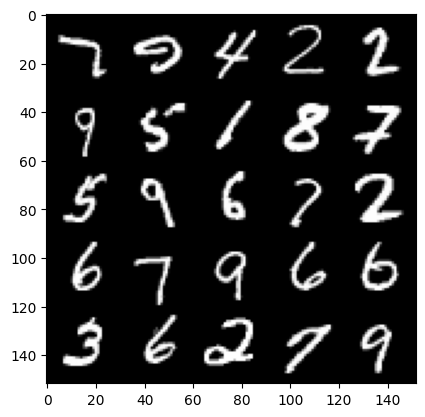

 65%|██████▍   | 710/1094 [01:29<00:52,  7.29it/s]

Epoch 35, step 39000: Generator loss: 0.6957850073575972, discriminator loss: 0.6940807727575303


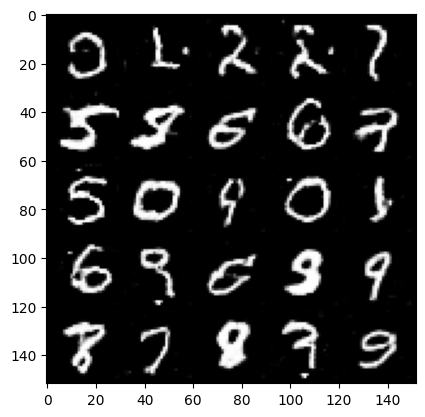

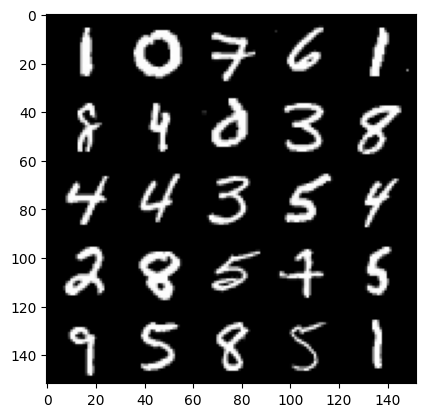

 11%|█         | 116/1094 [00:14<01:56,  8.42it/s]

Epoch 36, step 39500: Generator loss: 0.6956107703447338, discriminator loss: 0.6941990017890923


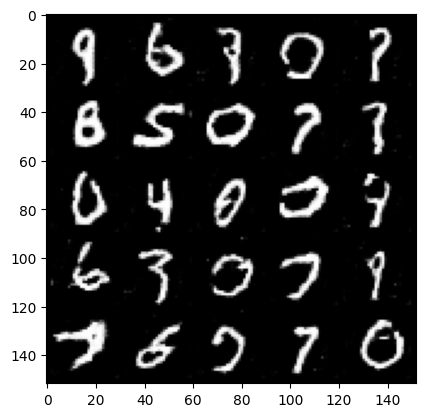

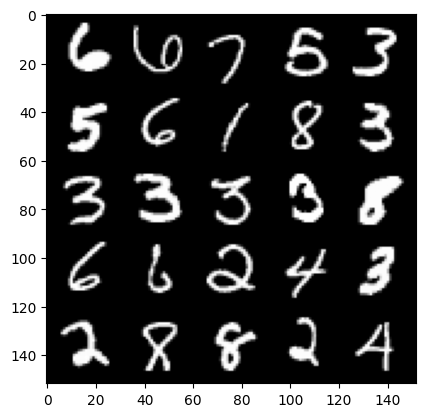

 56%|█████▋    | 616/1094 [01:14<00:56,  8.48it/s]

Epoch 36, step 40000: Generator loss: 0.6951523758172983, discriminator loss: 0.6940656820535654


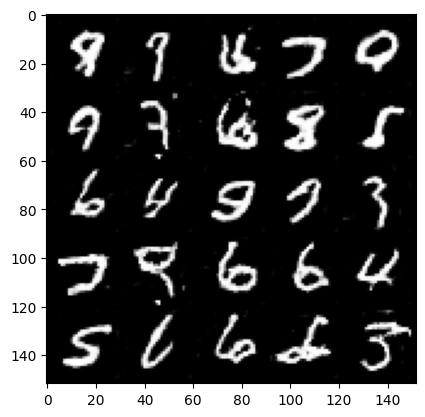

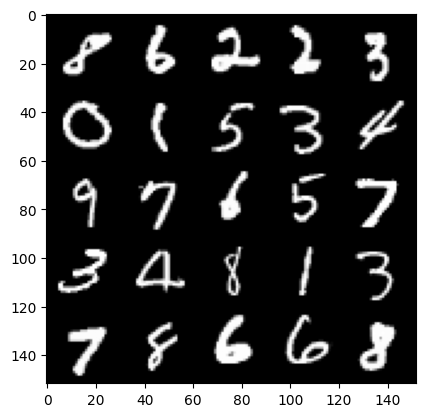

  2%|▏         | 22/1094 [00:02<02:07,  8.42it/s]

Epoch 37, step 40500: Generator loss: 0.6955607261657719, discriminator loss: 0.6939538660049437


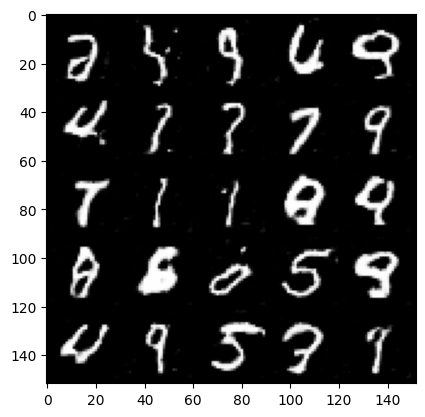

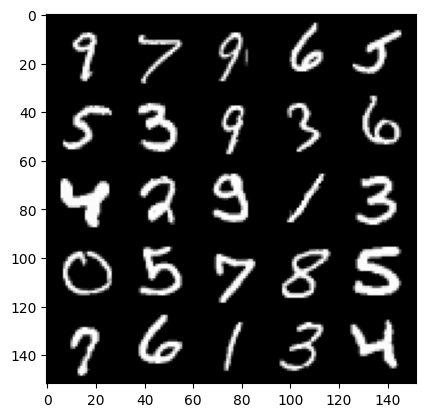

 48%|████▊     | 522/1094 [01:02<01:07,  8.45it/s]

Epoch 37, step 41000: Generator loss: 0.695926484465599, discriminator loss: 0.693958404898643


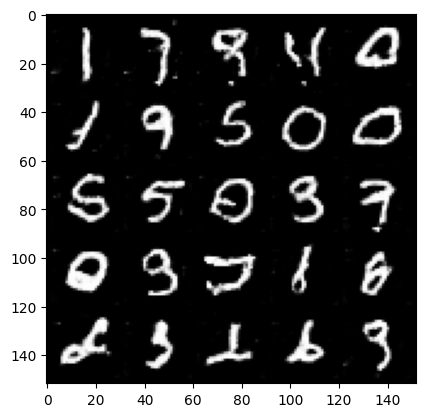

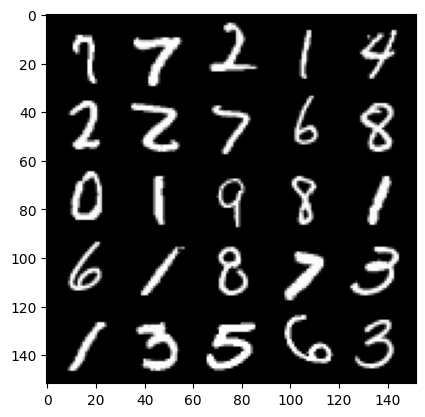

 93%|█████████▎| 1022/1094 [02:01<00:08,  8.60it/s]

Epoch 37, step 41500: Generator loss: 0.6952880799770365, discriminator loss: 0.6940775182247165


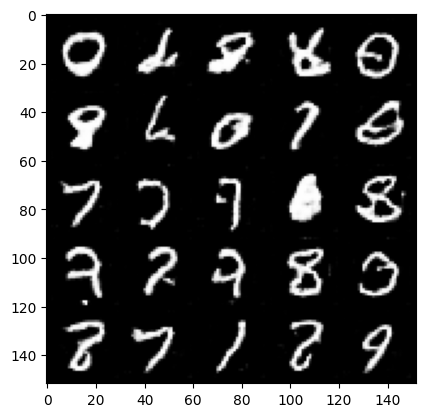

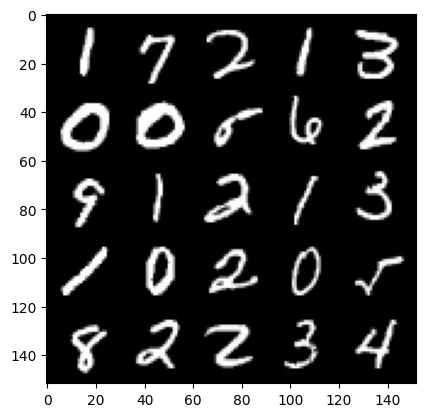

 39%|███▉      | 428/1094 [00:50<01:15,  8.84it/s]

Epoch 38, step 42000: Generator loss: 0.6949947444200513, discriminator loss: 0.6940282266139989


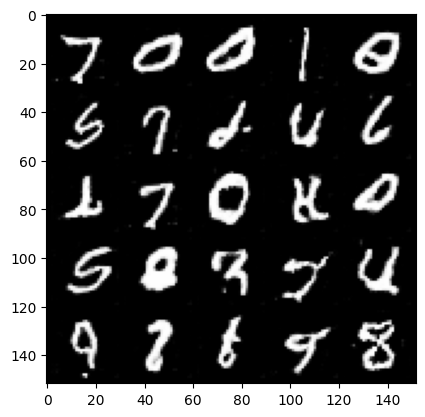

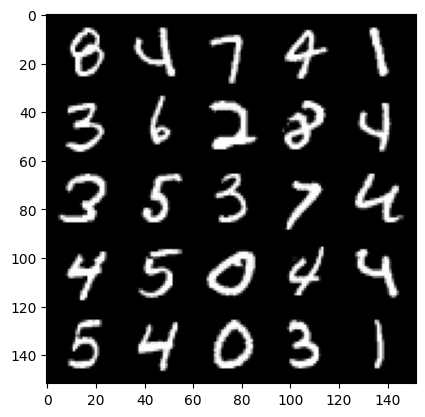

 85%|████████▍ | 928/1094 [01:49<00:20,  8.28it/s]

Epoch 38, step 42500: Generator loss: 0.695160393714905, discriminator loss: 0.6940232231616977


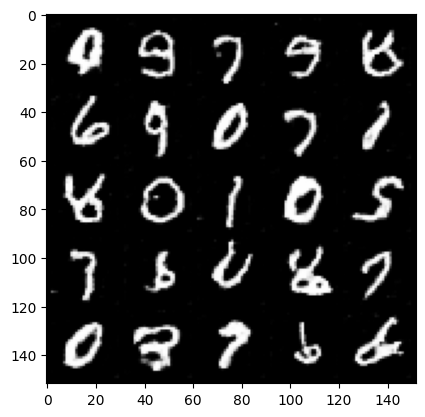

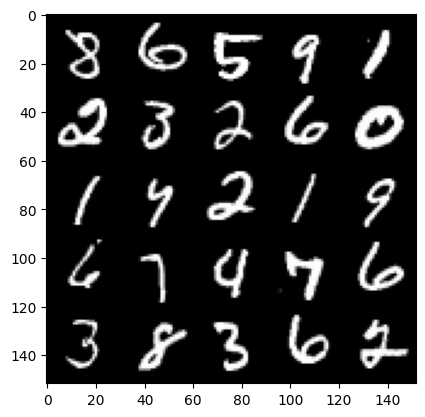

 31%|███       | 334/1094 [00:39<01:28,  8.61it/s]

Epoch 39, step 43000: Generator loss: 0.6954178606271745, discriminator loss: 0.6939187257289874


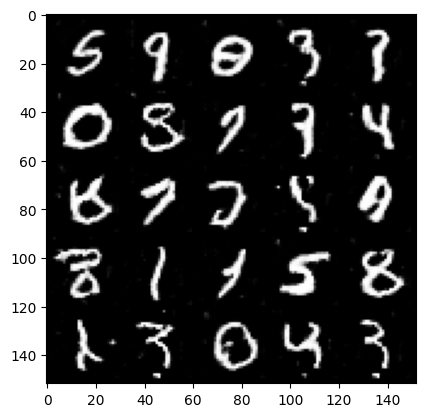

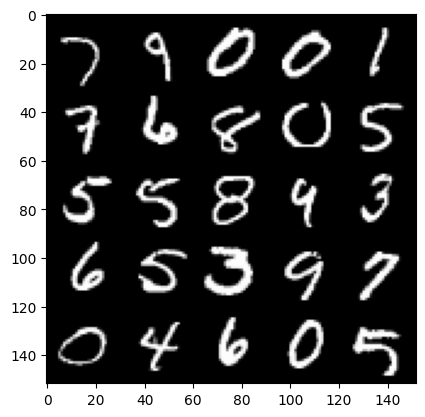

 76%|███████▌  | 834/1094 [01:39<00:31,  8.27it/s]

Epoch 39, step 43500: Generator loss: 0.6950010941028594, discriminator loss: 0.6939386433362958


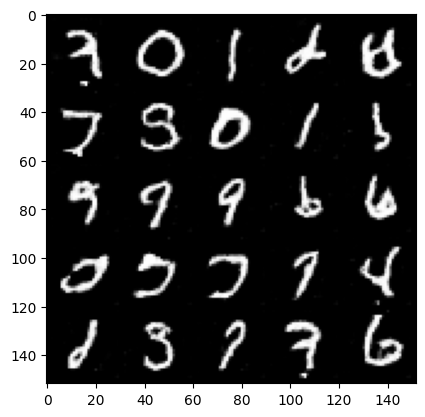

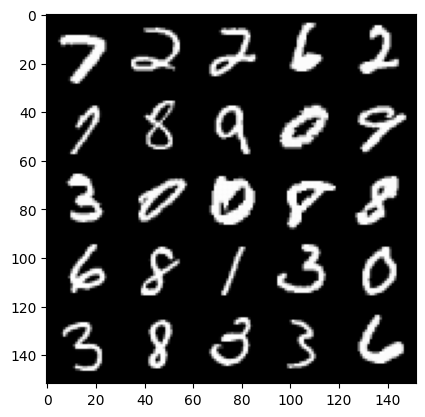

 22%|██▏       | 240/1094 [00:28<01:44,  8.17it/s]

Epoch 40, step 44000: Generator loss: 0.695166952967644, discriminator loss: 0.6938348076343542


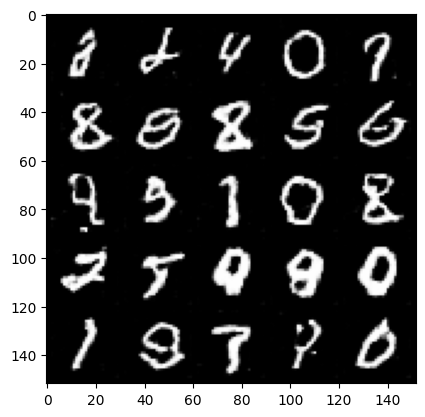

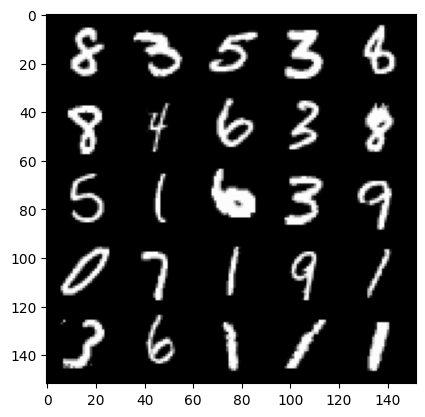

 68%|██████▊   | 740/1094 [01:27<00:40,  8.64it/s]

Epoch 40, step 44500: Generator loss: 0.6952945370674131, discriminator loss: 0.6938881150484092


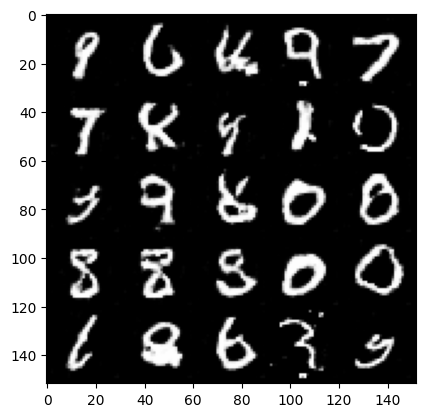

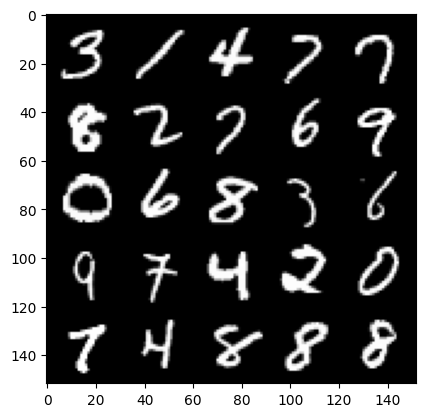

 13%|█▎        | 146/1094 [00:17<01:49,  8.64it/s]

Epoch 41, step 45000: Generator loss: 0.6948882473707202, discriminator loss: 0.6938740577697748


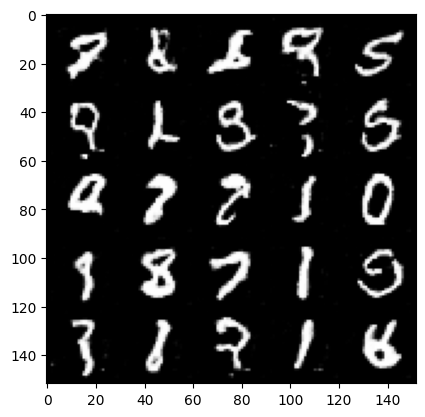

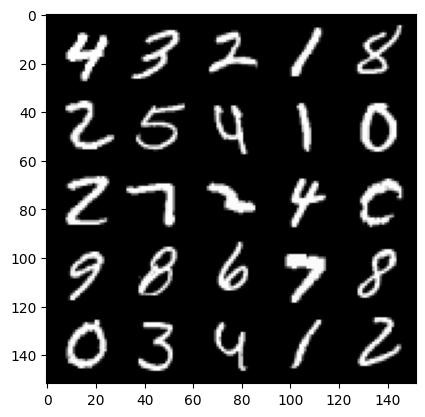

 59%|█████▉    | 646/1094 [01:17<00:53,  8.38it/s]

Epoch 41, step 45500: Generator loss: 0.6949736756086349, discriminator loss: 0.6937538069486621


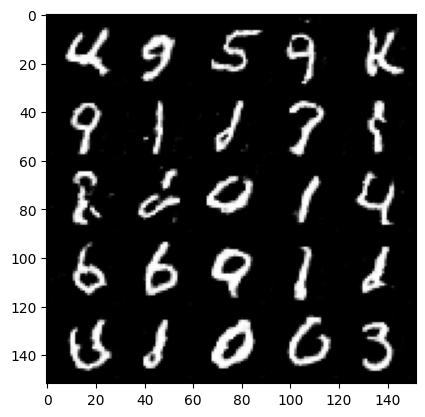

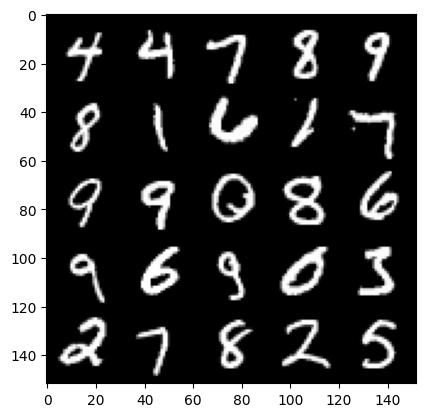

  5%|▍         | 52/1094 [00:06<02:01,  8.58it/s]

Epoch 42, step 46000: Generator loss: 0.6947647171020509, discriminator loss: 0.6938593857288363


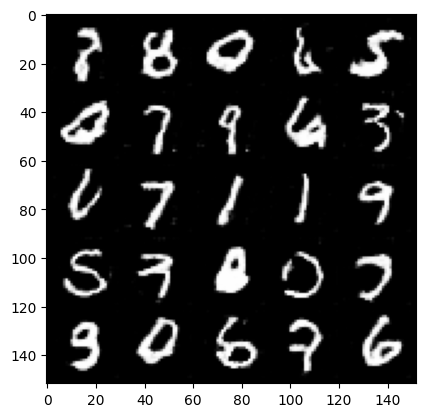

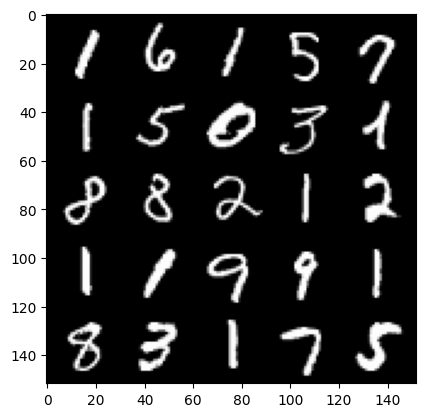

 50%|█████     | 552/1094 [01:06<01:04,  8.44it/s]

Epoch 42, step 46500: Generator loss: 0.69498824942112, discriminator loss: 0.6938301709890372


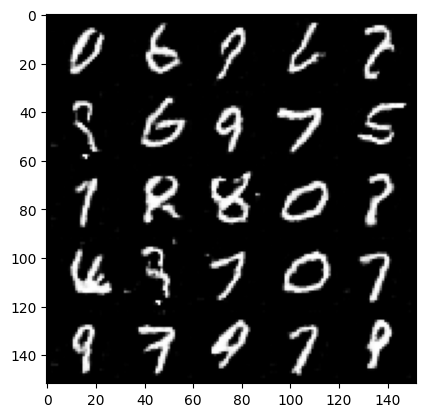

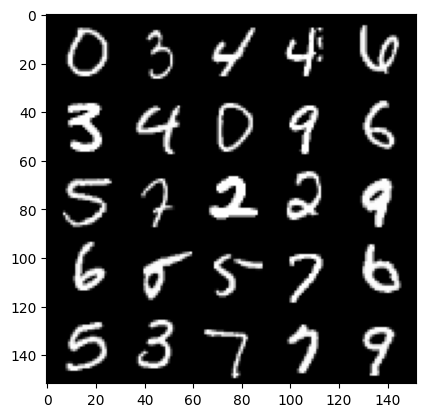

 96%|█████████▌| 1052/1094 [02:08<00:06,  6.71it/s]

Epoch 42, step 47000: Generator loss: 0.6950791397094729, discriminator loss: 0.6938199979066854


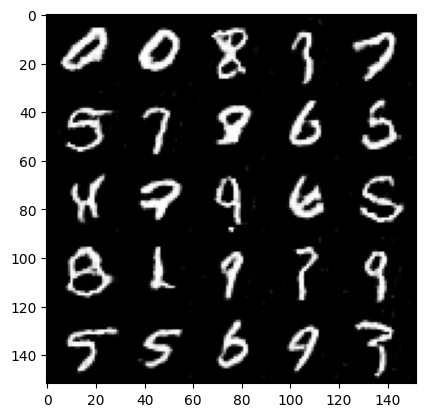

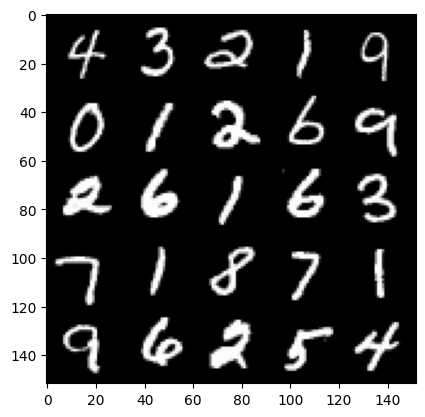

 42%|████▏     | 458/1094 [00:54<01:15,  8.45it/s]

Epoch 43, step 47500: Generator loss: 0.6948281172513967, discriminator loss: 0.6937501070499418


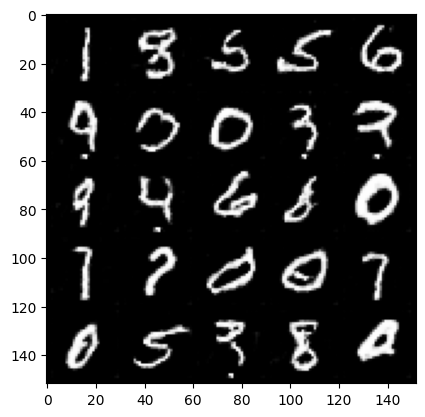

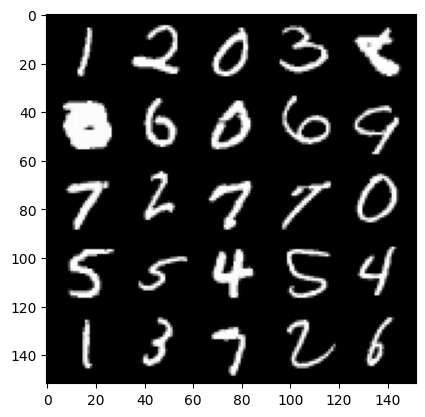

 88%|████████▊ | 958/1094 [01:54<00:16,  8.22it/s]

Epoch 43, step 48000: Generator loss: 0.6943820942640305, discriminator loss: 0.6937165890932088


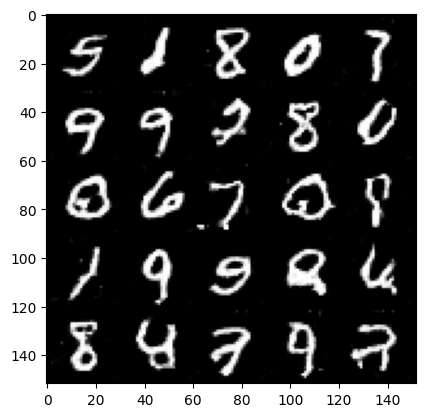

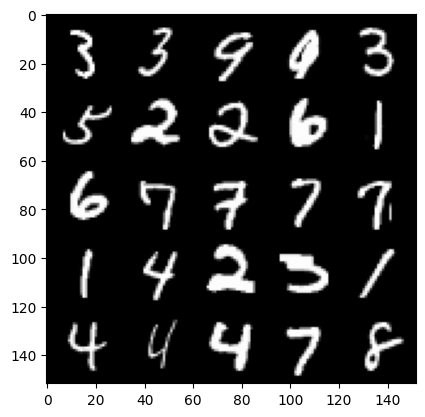

 33%|███▎      | 364/1094 [00:42<01:23,  8.74it/s]

Epoch 44, step 48500: Generator loss: 0.6948942540884017, discriminator loss: 0.6937750110626233


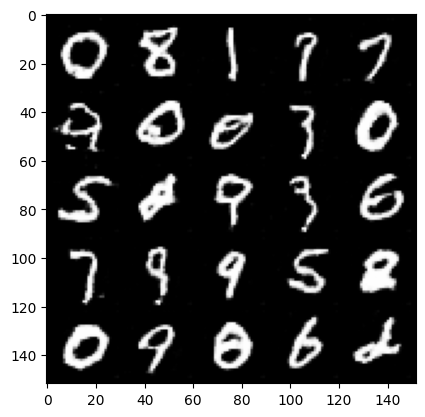

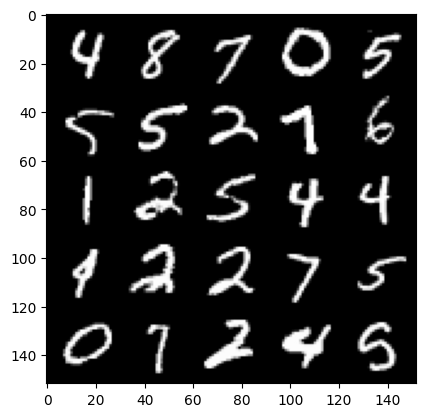

 79%|███████▉  | 864/1094 [01:48<00:31,  7.36it/s]

Epoch 44, step 49000: Generator loss: 0.6943516397476195, discriminator loss: 0.6937589632272726


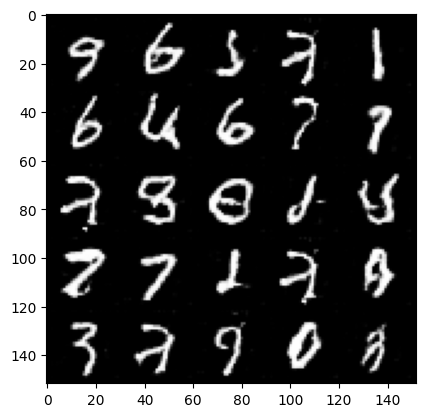

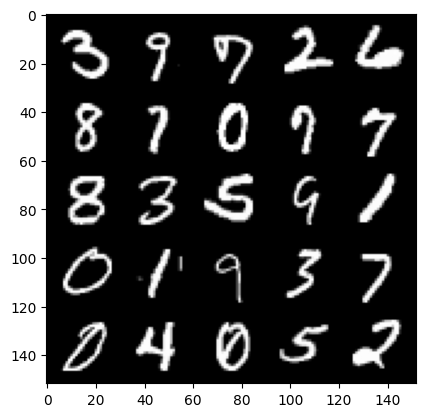

 25%|██▍       | 270/1094 [00:31<01:59,  6.88it/s]

Epoch 45, step 49500: Generator loss: 0.694264089465141, discriminator loss: 0.6938163157701488


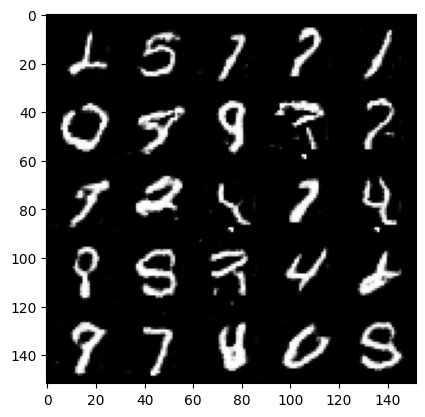

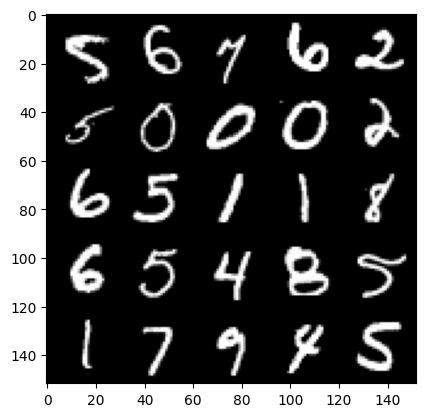

 70%|███████   | 770/1094 [01:29<00:35,  9.11it/s]

Epoch 45, step 50000: Generator loss: 0.6945704758167269, discriminator loss: 0.6937198394536979


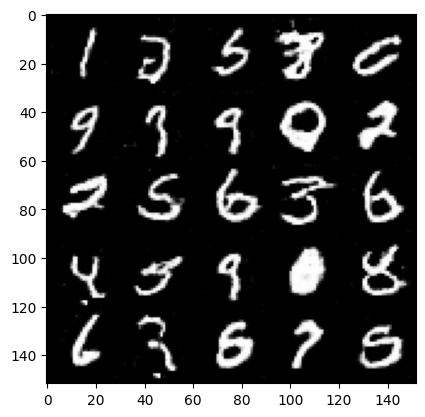

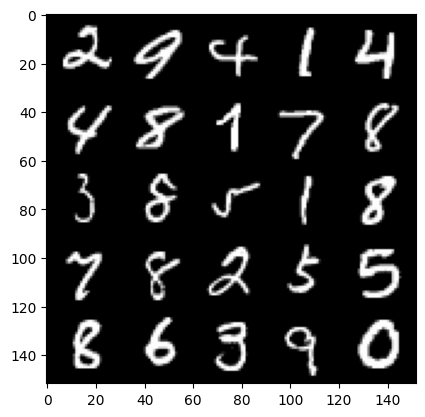

 16%|█▌        | 175/1094 [00:18<01:37,  9.39it/s]

Epoch 46, step 50500: Generator loss: 0.6946692961454394, discriminator loss: 0.6937268452644352


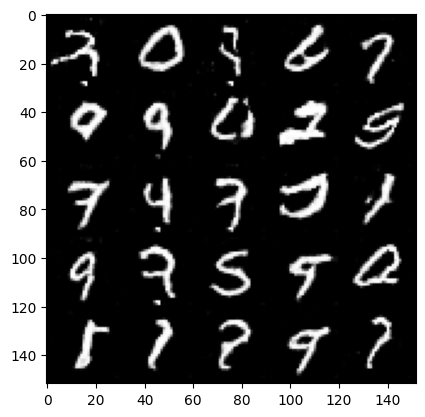

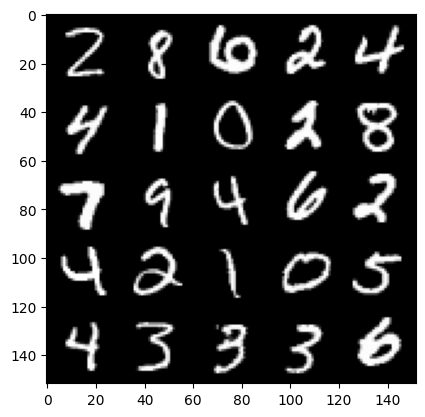

 62%|██████▏   | 676/1094 [01:11<00:43,  9.61it/s]

Epoch 46, step 51000: Generator loss: 0.6940201070308686, discriminator loss: 0.6936642302274696


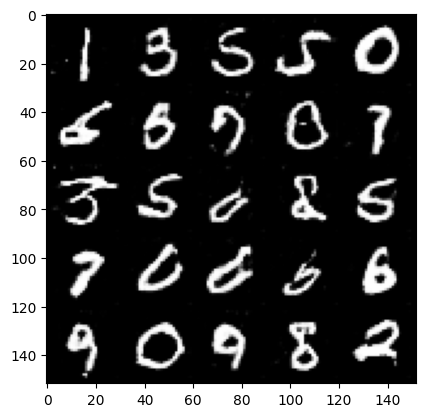

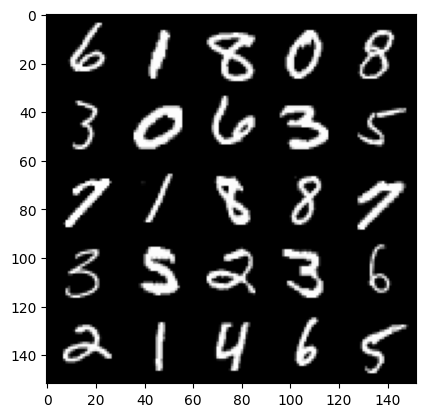

  7%|▋         | 82/1094 [00:08<01:49,  9.24it/s]

Epoch 47, step 51500: Generator loss: 0.6945524667501448, discriminator loss: 0.6936324659585953


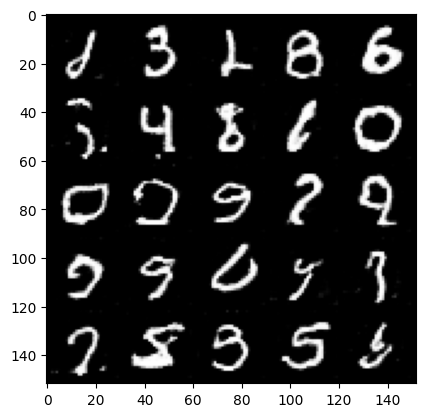

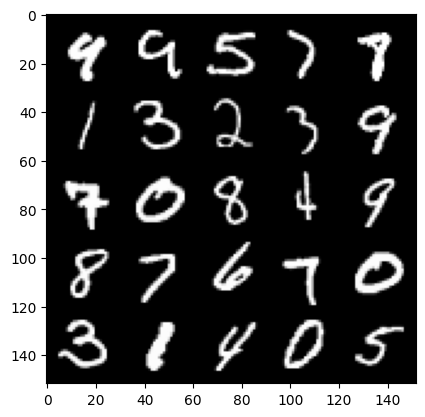

 53%|█████▎    | 582/1094 [01:01<00:52,  9.75it/s]

Epoch 47, step 52000: Generator loss: 0.6942631803750993, discriminator loss: 0.6936226752996436


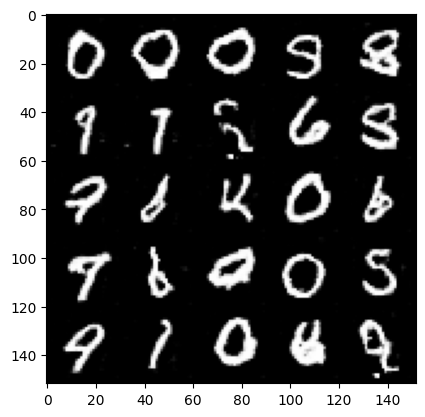

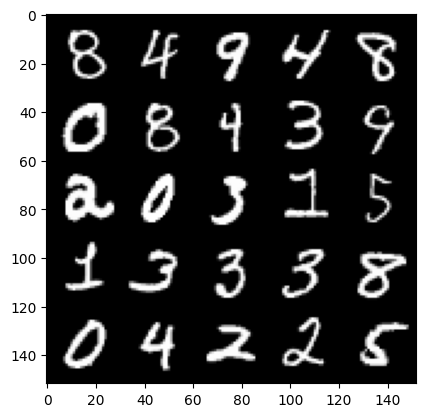

 99%|█████████▉| 1082/1094 [01:54<00:01,  9.35it/s]

Epoch 47, step 52500: Generator loss: 0.6946905128955845, discriminator loss: 0.6936818472146978


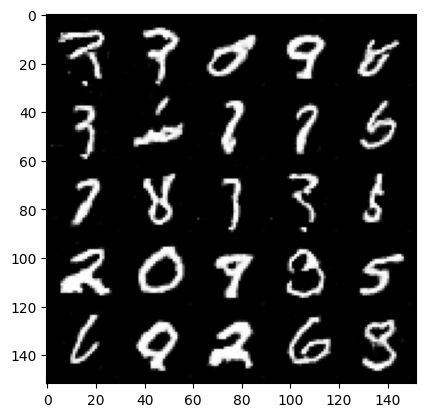

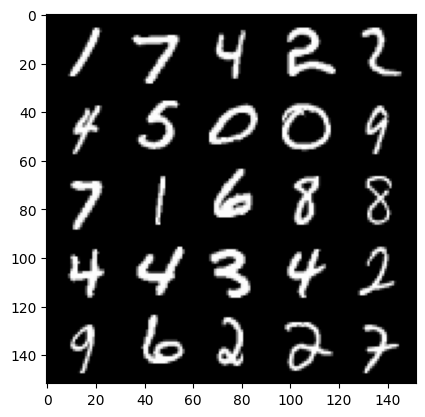

 45%|████▍     | 488/1094 [00:51<01:06,  9.12it/s]

Epoch 48, step 53000: Generator loss: 0.6944159297943119, discriminator loss: 0.6936549197435385


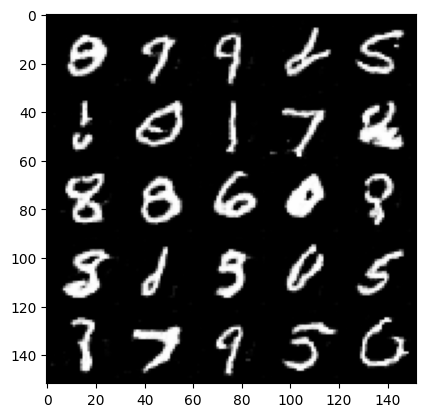

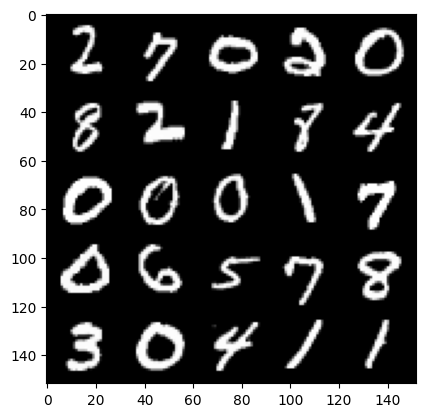

 90%|█████████ | 988/1094 [01:44<00:11,  9.42it/s]

Epoch 48, step 53500: Generator loss: 0.6942765179872511, discriminator loss: 0.6936303087472921


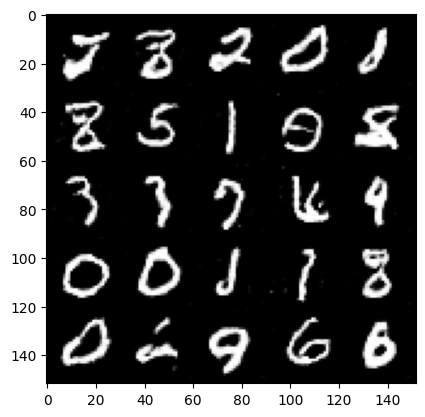

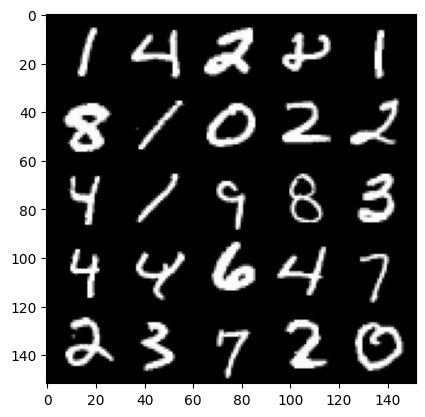

 36%|███▌      | 394/1094 [00:41<01:14,  9.40it/s]

Epoch 49, step 54000: Generator loss: 0.6938829909563068, discriminator loss: 0.6935958362817773


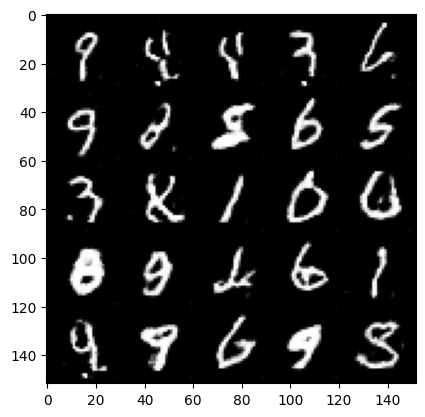

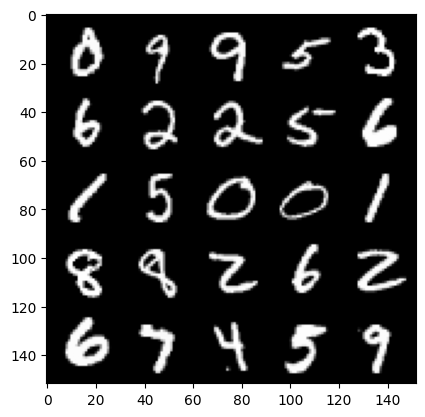

 82%|████████▏ | 894/1094 [01:34<00:20,  9.78it/s]

Epoch 49, step 54500: Generator loss: 0.6949836100339892, discriminator loss: 0.6937668205499637


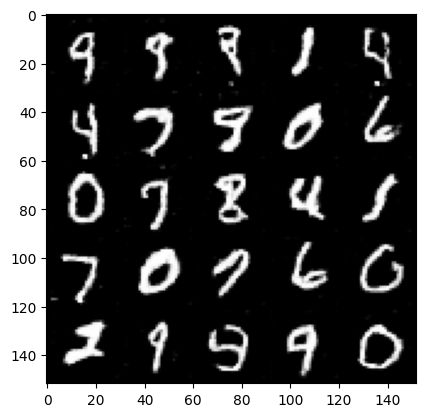

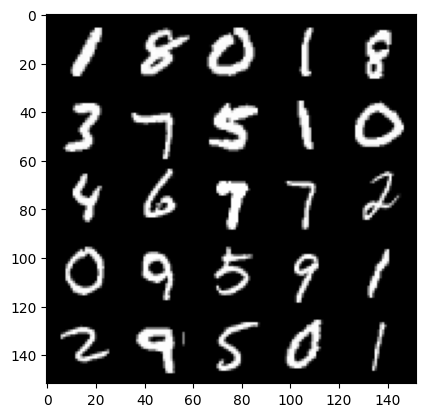

100%|██████████| 1094/1094 [01:55<00:00,  9.45it/s]


In [15]:
import torch
import matplotlib.pyplot as plt
from torchvision.utils import save_image
from tqdm import tqdm
import os

n_epochs = 50
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0

# Lists to store loss values for plotting
generator_losses = []
discriminator_losses = []

# Directory to save images
os.makedirs('generated_images', exist_ok=True)

for epoch in range(n_epochs):
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        ## Update discriminator ##
        disc_opt.zero_grad()
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2

        mean_discriminator_loss += disc_loss.item() / display_step
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        ## Update generator ##
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        disc_fake_pred = disc(fake_2)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        mean_generator_loss += gen_loss.item() / display_step

        # Save generated images for GIF
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            show_tensor_images(fake)
            show_tensor_images(real)

            # Save image for GIF creation
            save_image(fake, f'generated_images/fake_{cur_step}.png')
            save_image(real, f'generated_images/real_{cur_step}.png')

            # Update loss tracking lists for plotting
            generator_losses.append(mean_generator_loss)
            discriminator_losses.append(mean_discriminator_loss)

            # Reset loss trackers
            mean_generator_loss = 0
            mean_discriminator_loss = 0

        cur_step += 1

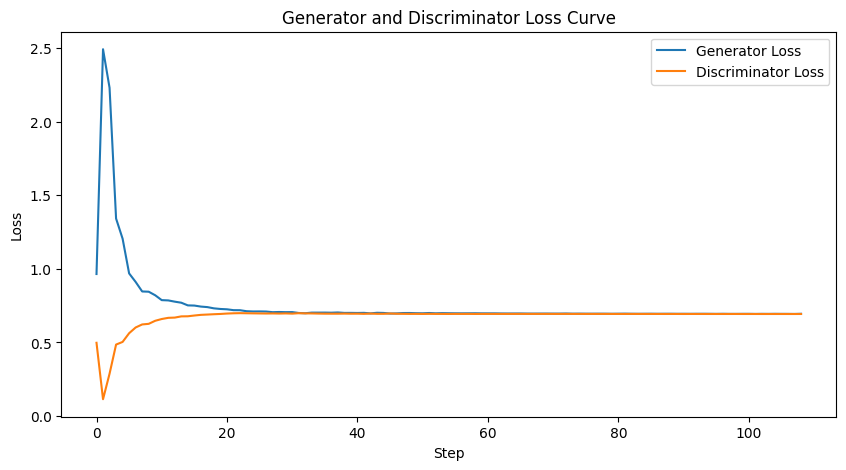

In [16]:
# Loss curve visualization after training
plt.figure(figsize=(10,5))
plt.plot(generator_losses, label='Generator Loss')
plt.plot(discriminator_losses, label='Discriminator Loss')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.title('Generator and Discriminator Loss Curve')
plt.legend()
plt.show()

In [23]:
# Save generator weights
torch.save(gen.state_dict(), "generator.pth")

In [17]:
# Create GIF from saved images
import imageio.v2 as imageio

images = []
for step in range(0, cur_step, display_step):
    img_path = f'generated_images/fake_{step}.png'
    if os.path.exists(img_path):
        images.append(imageio.imread(img_path))

imageio.mimsave('training_progress.gif', images, duration=0.1)

## 🎨 Visualization of Generated Images
To evaluate the progress of our Generator, we visualize generated digits every few epochs. These snapshots allow us to see how well the Generator is learning digit structures over time.

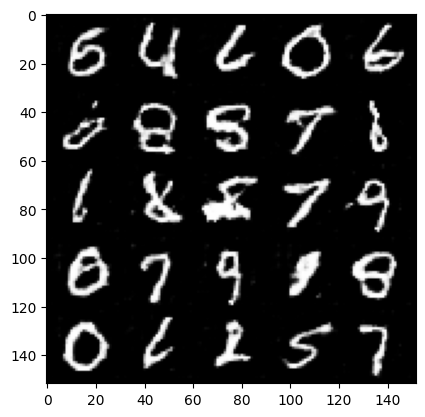

In [22]:
# Generate images after training
noise = get_noise(25, z_dim, device)
fake_images = gen(noise)
show_tensor_images(fake_images)

# Save grid of images
from torchvision.utils import save_image
save_image(fake_images.view(-1, 1, 28, 28), 'generated_digits.png', nrow=5)


<Figure size 800x600 with 0 Axes>

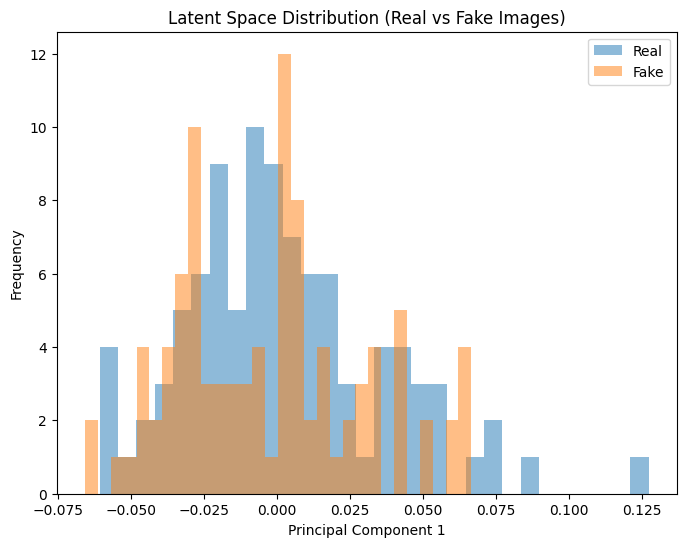

In [18]:
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import numpy as np

# Function to extract features from the discriminator
def extract_features(images, model, device):
    model.eval()
    with torch.no_grad():
        features = model(images)
    return features.view(features.size(0), -1).cpu().numpy()

# Extract real and fake features
real_images = real.to(device)  # Assuming `real` is already loaded from the dataloader
fake_images = gen(get_noise(len(real), z_dim, device=device)).detach()

# Extract features for real and fake images
real_features = extract_features(real_images, disc, device)
fake_features = extract_features(fake_images, disc, device)

# Combine real and fake features
features = np.concatenate([real_features, fake_features], axis=0)
labels = np.concatenate([np.ones(len(real_features)), np.zeros(len(fake_features))], axis=0)

# Reduce dimensions using PCA or t-SNE
# Ensure n_components is valid
n_components = min(features.shape[0], features.shape[1], 2)
pca = PCA(n_components=n_components)
pca_result = pca.fit_transform(features)

# or use t-SNE (more computationally expensive, but often better for visualization)
# tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
# tsne_result = tsne.fit_transform(features)

# Plot the results
plt.figure(figsize=(8, 6))
if n_components == 1:
    # If only one component, plot as a histogram
    plt.figure(figsize=(8, 6))
    plt.hist(pca_result[labels == 1, 0], bins=30, alpha=0.5, label='Real')
    plt.hist(pca_result[labels == 0, 0], bins=30, alpha=0.5, label='Fake')
    plt.title('Latent Space Distribution (Real vs Fake Images)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()
else:
    # If more than one component, plot as a scatter plot
    plt.figure(figsize=(8, 6))
    plt.scatter(pca_result[labels == 1, 0], pca_result[labels == 1, 1], label='Real', alpha=0.5)
    plt.scatter(pca_result[labels == 0, 0], pca_result[labels == 0, 1], label='Fake', alpha=0.5)
    plt.title('Latent Space Distribution (Real vs Fake Images)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend()
    plt.show()


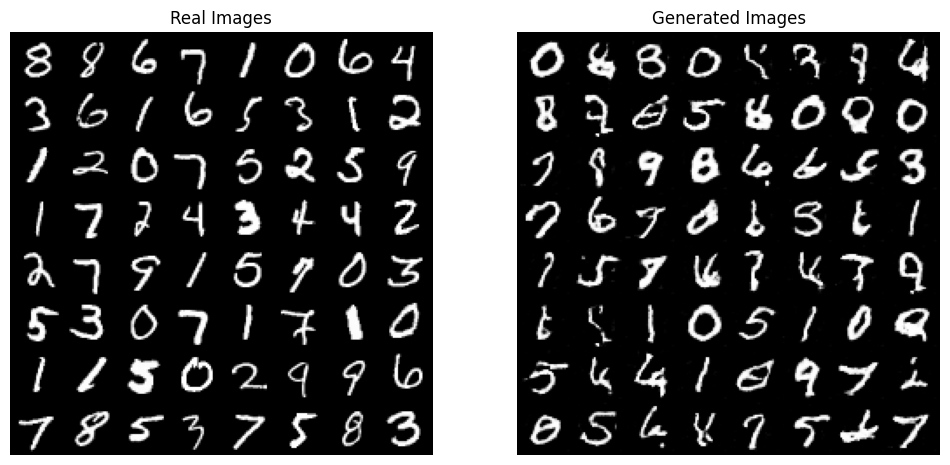

In [19]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Generate fake images
fake_images = gen(get_noise(64, z_dim, device=device)).detach()

# Show real images (assuming you have a batch of real images)
real_images = real[:64]  # Show a batch of 64 real images

# Visualize real images and fake images side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Real images
axes[0].imshow(vutils.make_grid(real_images, normalize=True).cpu().numpy().transpose((1, 2, 0)))
axes[0].set_title("Real Images")
axes[0].axis('off')

# Generated images
axes[1].imshow(vutils.make_grid(fake_images, normalize=True).cpu().numpy().transpose((1, 2, 0)))
axes[1].set_title("Generated Images")
axes[1].axis('off')

plt.show()


In [20]:
from torchvision.models.inception import inception_v3
import torch.nn.functional as F
import numpy as np

# InceptionV3 model
inception_model = inception_v3(pretrained=True, transform_input=False)
inception_model.eval().to(device)

def inception_score(images, splits=10):
    # Preprocess images for InceptionV3
    images = F.interpolate(images, size=(299, 299), mode='bilinear', align_corners=False)
    images = images.repeat(1, 3, 1, 1)  # Convert 1-channel images to 3-channel images
    images = (images - 0.5) / 0.5  # Normalize to [-1, 1]

    # Calculate inception score using split method
    all_preds = []
    for i in range(0, len(images), 32):
        batch = images[i:i+32].to(device)
        with torch.no_grad():
            preds = inception_model(batch)
            preds = F.softmax(preds, dim=1)
            all_preds.append(preds.cpu().numpy())

    all_preds = np.concatenate(all_preds, axis=0)
    p_y = np.mean(all_preds, axis=0)
    kl_div = all_preds * (np.log(all_preds + 1e-16) - np.log(p_y + 1e-16))
    kl_div = np.mean(np.sum(kl_div, axis=1))
    
    return np.exp(kl_div)

# Compute Inception Score for generated images
print(f"Inception Score: {inception_score(fake_images)}")


d:\Program Files\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Program Files\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Inception Score: 2.405489921569824


### ✅ Summary

In this project, I implemented and trained a Deep Convolutional GAN (DCGAN) using PyTorch.
- Trained on the MNIST dataset
- Used a 4-layer CNN-based Generator and 3-layer Discriminator with LeakyReLU (slope 0.2)
- Visualized training progress with saved images and an animated GIF
- Tracked generator/discriminator loss curves and computed Inception Score (2.15)

**Next steps:** Explore latent space distribution, experiment with Conditional GANs, and improve generator output quality.
